In [ ]:
# installing required packages

%pip install Pillow 
%pip install matplotlib
%pip install numpy
%pip install opencv-python
%pip install scikit-image
%pip install scikit-learn
%pip install tensorflow
%pip install keras

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 4.2 MB/s eta 0:00:00a 0:00:01
Note: you may need to restart the kernel to use updated packages.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.0/8.0 MB 5.4 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 4.1 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 5.7 MB/s eta 0:00:00a 0:00:01
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 37.3/37.3 MB 5.0 MB/s eta 0:00:0000:0100:01
Note: you may need to restart the kernel to use updated packages.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.2/13.2 MB 6.9 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 7.8 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.4/22.4 MB 5.7 MB/s eta 0:00:00a 0:00:01
Note: you may need to restart the kernel to use u

# Step#1: Data Structurization

The dataset folder 'raw_endoscopic_scans' has all the endoscopic scans. The following block of code produces. The hierarchy created is as follows: main folder -> ROI folder (1, 2 or 3) -> scan folder (10 total for each ROI) -> PMT file (1 or 2). Finally, it displays image and relevant metedata for one pair of scans from each ROI.

In [28]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from glob import glob
from collections import defaultdict
from itertools import islice

data_path = os.path.expanduser("/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/raw_endoscopic_scans")
pixel_size_um = 1.5  # Micrometers per pixel in actual tissue

def get_roi_id(filename):
    parts = filename.split('-')
    timestamp = parts[2]  # e.g., '231205'
    key = timestamp[2:4]  # Extract '12', '18', or '19'
    roi_map = {'12': 'ROI_1', '18': 'ROI_2', '19': 'ROI_3'}
    return roi_map.get(key, 'Unknown')

def get_image_metadata(image_path):
    with Image.open(image_path) as img:
        img_array = np.array(img)
        image_size = img.size  # (width, height)
        field_of_view_um = (image_size[0] * pixel_size_um, image_size[1] * pixel_size_um)
        area_mm2 = (field_of_view_um[0] * field_of_view_um[1]) / 1e6
        metadata = {
            "Filename": os.path.basename(image_path),
            "Size (WxH)": image_size,
            "Mode": img.mode,
            "Pixel Min/Max": img.getextrema(),
            "Data Type": img_array.dtype,
            "Bits per Pixel": img.bits if hasattr(img, 'bits') else img_array.dtype.itemsize * 8,
            "Total Pixel Values": 2 ** (img.bits if hasattr(img, 'bits') else img_array.dtype.itemsize * 8),
            "Resolution (DPI)": img.info.get('dpi', 'Not available'),
            "Pixel Size (um)": pixel_size_um,
            "Field of View (um)": field_of_view_um,
            "Scanned Area (mm²)": area_mm2
        }
        return metadata, img_array

# pairing based on channels (PMT1 and PMT2)

tiff_files = sorted(glob(os.path.join(data_path, "*.tiff")))
image_pairs = {}
for f in tiff_files:
    base = "-".join(os.path.basename(f).split("-")[:-1])
    channel = f.split("-")[-1].replace(".tiff", "")
    if base not in image_pairs:
        image_pairs[base] = {}
    image_pairs[base][channel] = f

# organizing image pairs by region of interest (ROI) leveraging the timestamps within actual filenames

roi_image_pairs = defaultdict(dict)
for base, channels in image_pairs.items():
    filename = list(channels.values())[0]
    roi_id = get_roi_id(filename)
    if roi_id != 'Unknown':
        roi_image_pairs[roi_id][base] = channels
    else:
        print(f"Warning: Unknown ROI in file {filename}")

print("\n Region of Interest (ROI)-based organization of dual-PMT scan pairs complete. Preview is as follows:")
preview = dict(islice(roi_image_pairs.items(), 5))
print(preview)


 Region of Interest (ROI)-based organization of dual-PMT scan pairs complete. Preview is as follows:
{'ROI_1': {'Image-20250326-231205-592': {'PMT1': '/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/raw_endoscopic_scans/Image-20250326-231205-592-PMT1.tiff', 'PMT2': '/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/raw_endoscopic_scans/Image-20250326-231205-592-PMT2.tiff'}, 'Image-20250326-231206-153': {'PMT1': '/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/raw_endoscopic_scans/Image-20250326-231206-153-PMT1.tiff', 'PMT2': '/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/raw_endoscopic_scans/Image-20250326-231206-153-PMT2.tiff'}, 'Image-20250326-231206-703': {'PMT1': '/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/raw_endoscopic_scans/Image-20250326-231206-703-PMT1.tiff', 'PMT2': '/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/raw_endoscopic_scans/Image-20250326-231206-703-PMT2.tiff'}, 'Image-20250326-231207-268': {'PMT1': 

Now save it as a new organized folder within the data folder.

In [ ]:
import os
import shutil

# Define the umbrella folder path where the organized data will reside
output_root = os.path.join("/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset", "organised_endoscopic_scans")

# Create the umbrella folder if it doesn't exist
os.makedirs(output_root, exist_ok=True)

# Iterate through each ROI in our dictionary of image pairs
for roi, scans in roi_image_pairs.items():
    # Create a folder for each ROI under the umbrella folder
    roi_folder = os.path.join(output_root, roi)
    os.makedirs(roi_folder, exist_ok=True)
    
    # For each scan (base name) in the current ROI, create a scan folder
    for base, channels in scans.items():
        # Construct the folder path for this scan
        scan_folder = os.path.join(roi_folder, base)
        os.makedirs(scan_folder, exist_ok=True)
        
        # For each channel (e.g., PMT1 and PMT2) in the scan, copy the file into the scan folder
        for channel, filepath in channels.items():
            # Construct a new filename to indicate the channel explicitly
            # For example, if the original file was something like "scan1.tiff", it becomes "PMT1.tiff"
            dest_filename = f"{channel}.tiff"
            destination = os.path.join(scan_folder, dest_filename)
            
            # Copy the file from its original location to the new organized folder
            shutil.copy(filepath, destination)

# Step#2: Data Characterization 

a) Visualization & Metadata Extraction
The following block of code visualises a random pair of images from each ROI alongside their metadata. 
Each scan is a 16-bit (unsigned integer) grayscale image. Each pixel can take up one of the 65,536 values to represent a shade of gray. Image size 385 x 385 pixels. Field of view in 577.5 x 577.5 microns on the actual tissue while the scanned area is 0.33350625 mm². 


🔬 ROI: ROI_1

📷 PMT1 Metadata:
  Filename: Image-20250326-231205-592-PMT1.tiff
  Size (WxH): (385, 385)
  Mode: I;16
  Pixel Min/Max: (0, 65535)
  Data Type: uint16
  Bits per Pixel: 16
  Total Pixel Values: 65536
  Resolution (DPI): Not available
  Pixel Size (um): 1.5
  Field of View (um): (577.5, 577.5)
  Scanned Area (mm²): 0.33350625

📷 PMT2 Metadata:
  Filename: Image-20250326-231205-592-PMT2.tiff
  Size (WxH): (385, 385)
  Mode: I;16
  Pixel Min/Max: (0, 65535)
  Data Type: uint16
  Bits per Pixel: 16
  Total Pixel Values: 65536
  Resolution (DPI): Not available
  Pixel Size (um): 1.5
  Field of View (um): (577.5, 577.5)
  Scanned Area (mm²): 0.33350625


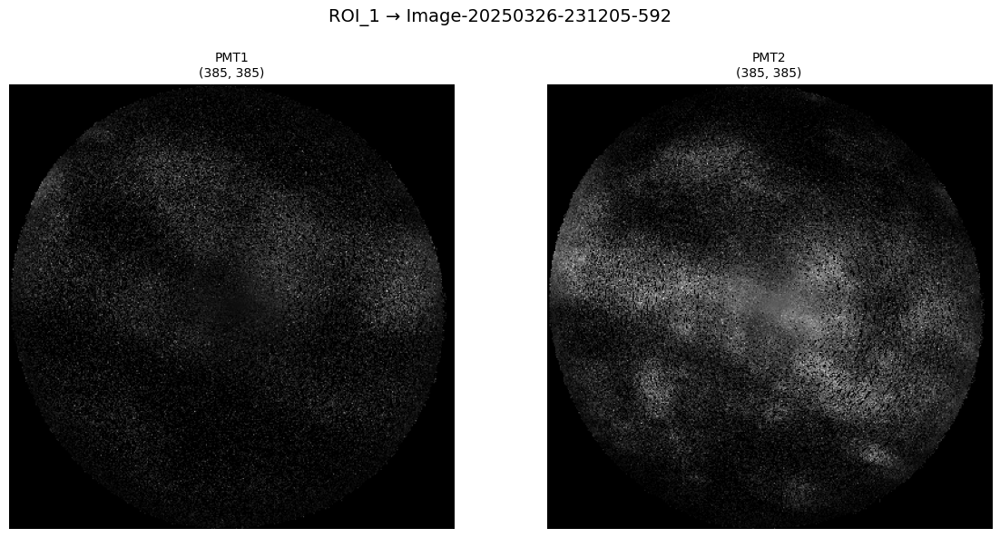


🔬 ROI: ROI_2

📷 PMT1 Metadata:
  Filename: Image-20250326-231805-203-PMT1.tiff
  Size (WxH): (385, 385)
  Mode: I;16
  Pixel Min/Max: (0, 65535)
  Data Type: uint16
  Bits per Pixel: 16
  Total Pixel Values: 65536
  Resolution (DPI): Not available
  Pixel Size (um): 1.5
  Field of View (um): (577.5, 577.5)
  Scanned Area (mm²): 0.33350625

📷 PMT2 Metadata:
  Filename: Image-20250326-231805-203-PMT2.tiff
  Size (WxH): (385, 385)
  Mode: I;16
  Pixel Min/Max: (0, 65535)
  Data Type: uint16
  Bits per Pixel: 16
  Total Pixel Values: 65536
  Resolution (DPI): Not available
  Pixel Size (um): 1.5
  Field of View (um): (577.5, 577.5)
  Scanned Area (mm²): 0.33350625


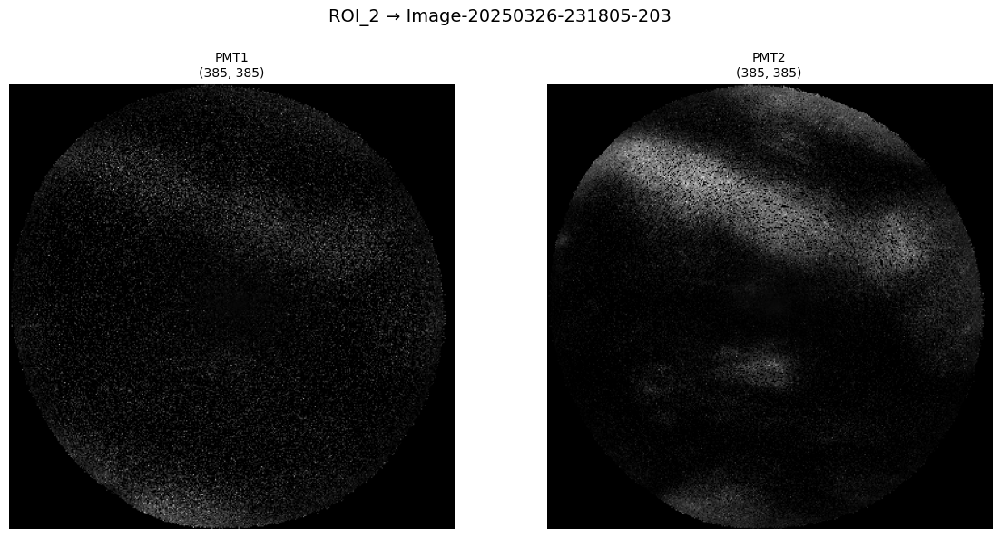


🔬 ROI: ROI_3

📷 PMT1 Metadata:
  Filename: Image-20250326-231913-390-PMT1.tiff
  Size (WxH): (385, 385)
  Mode: I;16
  Pixel Min/Max: (0, 65535)
  Data Type: uint16
  Bits per Pixel: 16
  Total Pixel Values: 65536
  Resolution (DPI): Not available
  Pixel Size (um): 1.5
  Field of View (um): (577.5, 577.5)
  Scanned Area (mm²): 0.33350625

📷 PMT2 Metadata:
  Filename: Image-20250326-231913-390-PMT2.tiff
  Size (WxH): (385, 385)
  Mode: I;16
  Pixel Min/Max: (0, 65535)
  Data Type: uint16
  Bits per Pixel: 16
  Total Pixel Values: 65536
  Resolution (DPI): Not available
  Pixel Size (um): 1.5
  Field of View (um): (577.5, 577.5)
  Scanned Area (mm²): 0.33350625


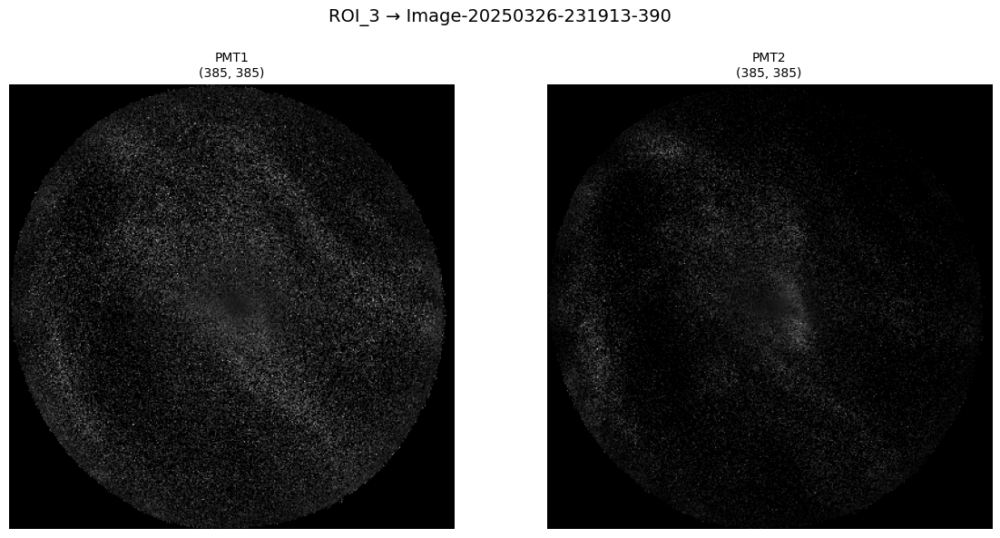

In [29]:
for roi, pairs in roi_image_pairs.items():
    print(f"\n🔬 ROI: {roi}")
    base_name, channels = next(iter(pairs.items()))
    
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))
    fig.suptitle(f"{roi} → {base_name}", fontsize=14)

    for i, channel in enumerate(["PMT1", "PMT2"]):
        image_path = channels.get(channel)
        if image_path:
            metadata, img_array = get_image_metadata(image_path)
            axs[i].imshow(img_array, cmap='gray')
            axs[i].axis('off')
            axs[i].set_title(f"{channel}\n{metadata['Size (WxH)']}", fontsize=10)

            print(f"\n📷 {channel} Metadata:")
            for key, val in metadata.items():
                print(f"  {key}: {val}")
        else:
            print(f"⚠️ {channel} image missing for {base_name}")
    
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


b) Pixel Intensity Histograms
Count of pixels for a given intensity value [0,65535]. Distribution of intensities. 

First, pixel intensity histograms for all 60 images are plotted. 20 for each ROI (10 for each channel). This helps eyeballing the general trend throughout each ROI. However, large peaks force a scale that made smaller features indiscernible. There is a constant peak at 0 which represents the dark background.

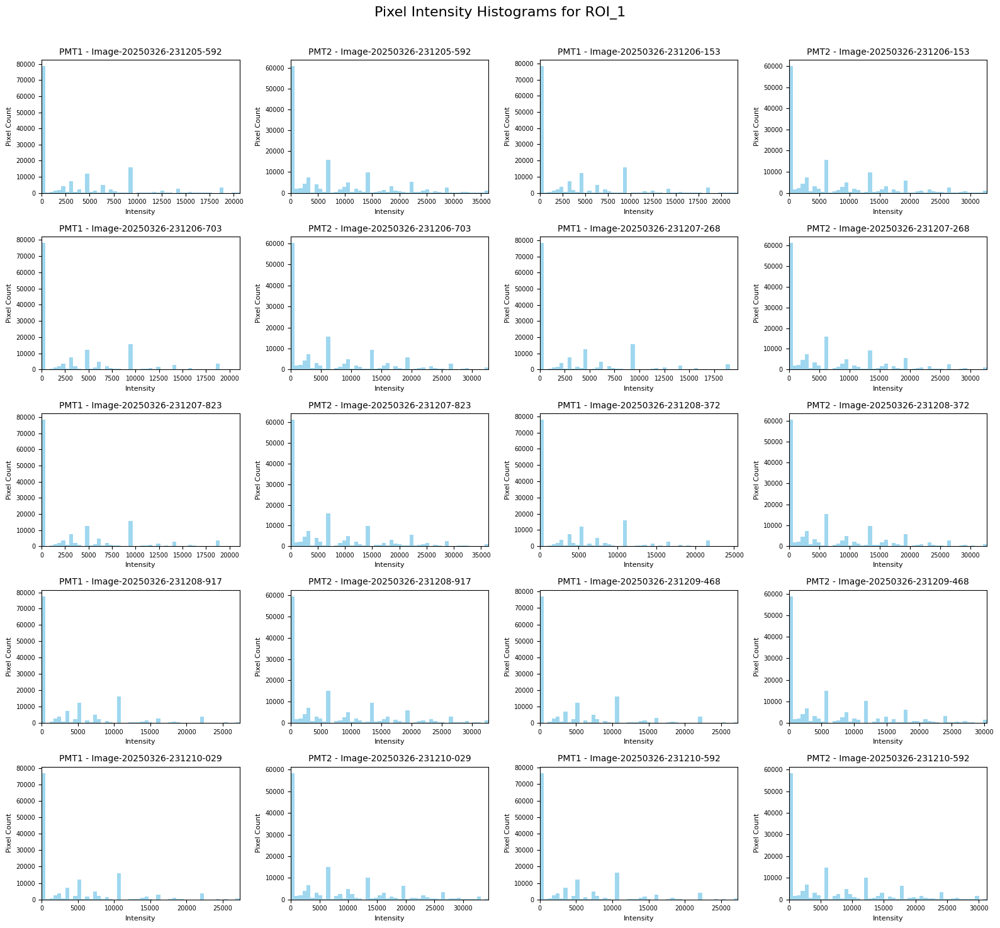

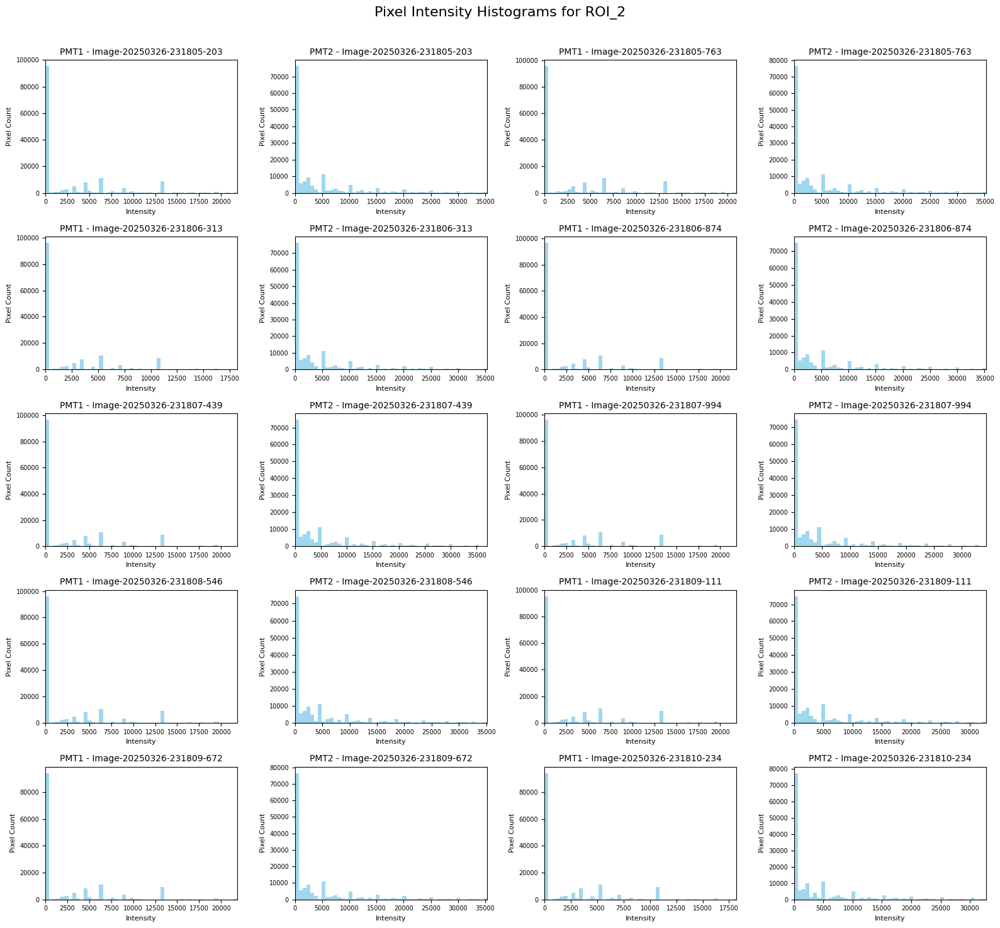

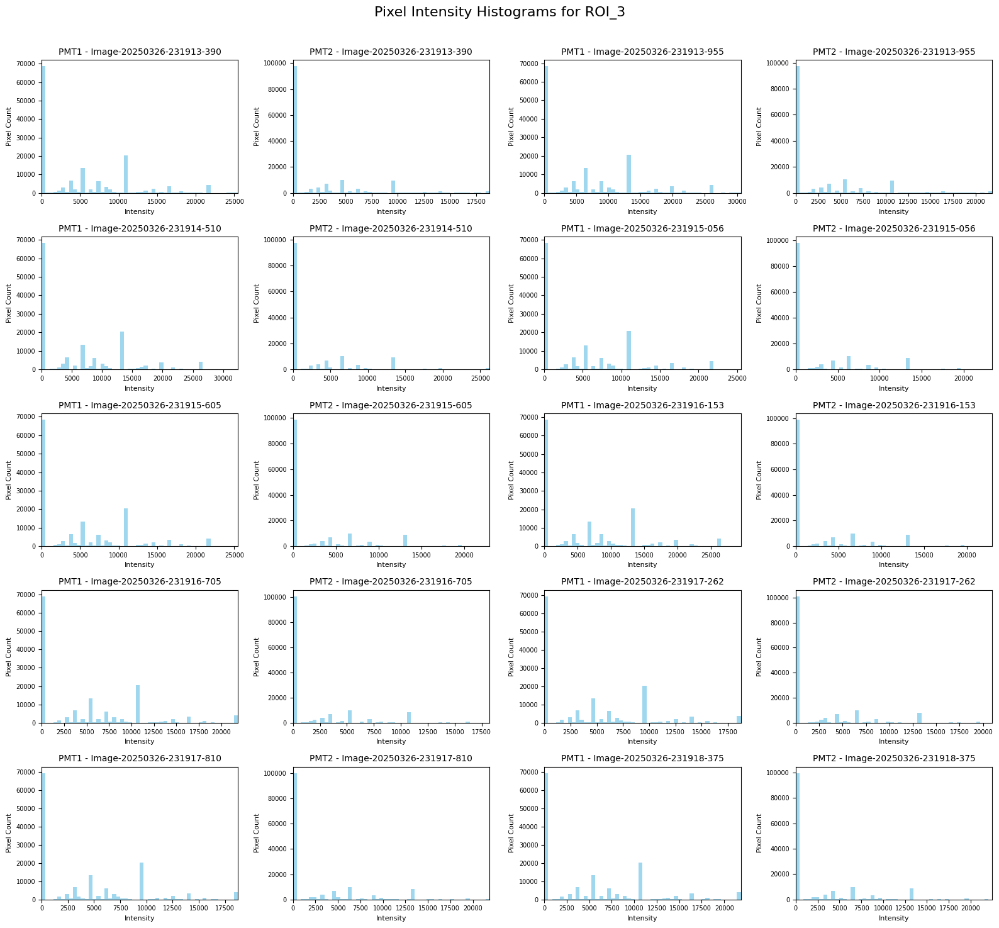

In [81]:
import matplotlib.pyplot as plt
import numpy as np

# 2 coloumns per image (PMT1, PMT2)
n_cols = 4  

# two plots per image
for roi, pairs in roi_image_pairs.items():
    n_images = len(pairs)
    n_rows = int(np.ceil(n_images / (n_cols // 2)))  

    fig, axs = plt.subplots(n_rows, n_cols, figsize=(n_cols * 4, n_rows * 3))
    fig.suptitle(f"Pixel Intensity Histograms for {roi}", fontsize=16)
    axs = axs.flatten()

    for i, (base_name, channels) in enumerate(pairs.items()):
        for j, channel in enumerate(["PMT1", "PMT2"]):
            img_path = channels[channel]
            metadata, img_array = get_image_metadata(img_path)

            ax_idx = i * 2 + j
            ax = axs[ax_idx]

            all_pixels = img_array.flatten()
            upper_limit = np.percentile(all_pixels, 99)

            ax.hist(all_pixels, bins=50, color="skyblue", alpha=0.8, density=False, range=(0, upper_limit))
            ax.set_xlim(0, upper_limit)
            ax.set_title(f"{channel} - {base_name}", fontsize=10)
            ax.set_xlabel("Intensity", fontsize=8)
            ax.set_ylabel("Pixel Count", fontsize=8)
            ax.tick_params(axis='both', labelsize=7)

    for idx in range(n_images * 2, len(axs)):
        axs[idx].axis("off")

    plt.tight_layout(rect=[0, 0, 1, 0.97]) 
    plt.show()


The consistent peak at 0 represents the background. Let's try plotting histograms without it for a better understanding of the actual image signals.

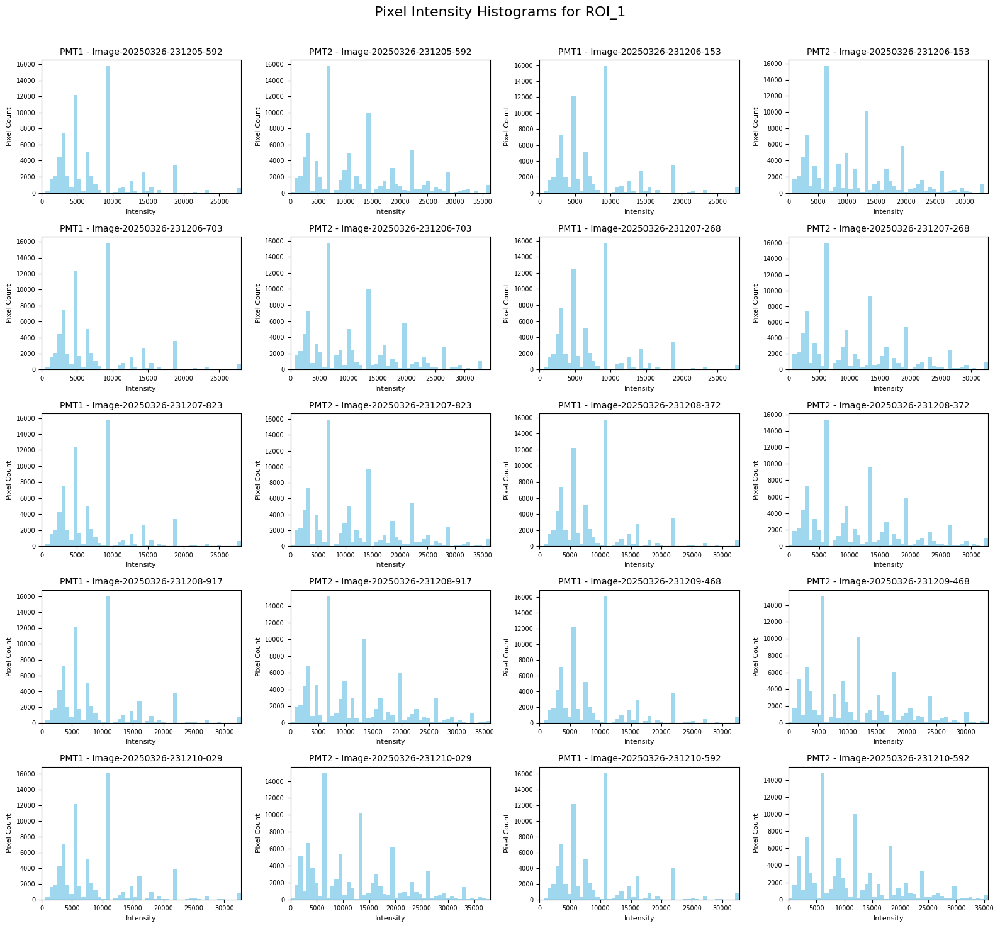

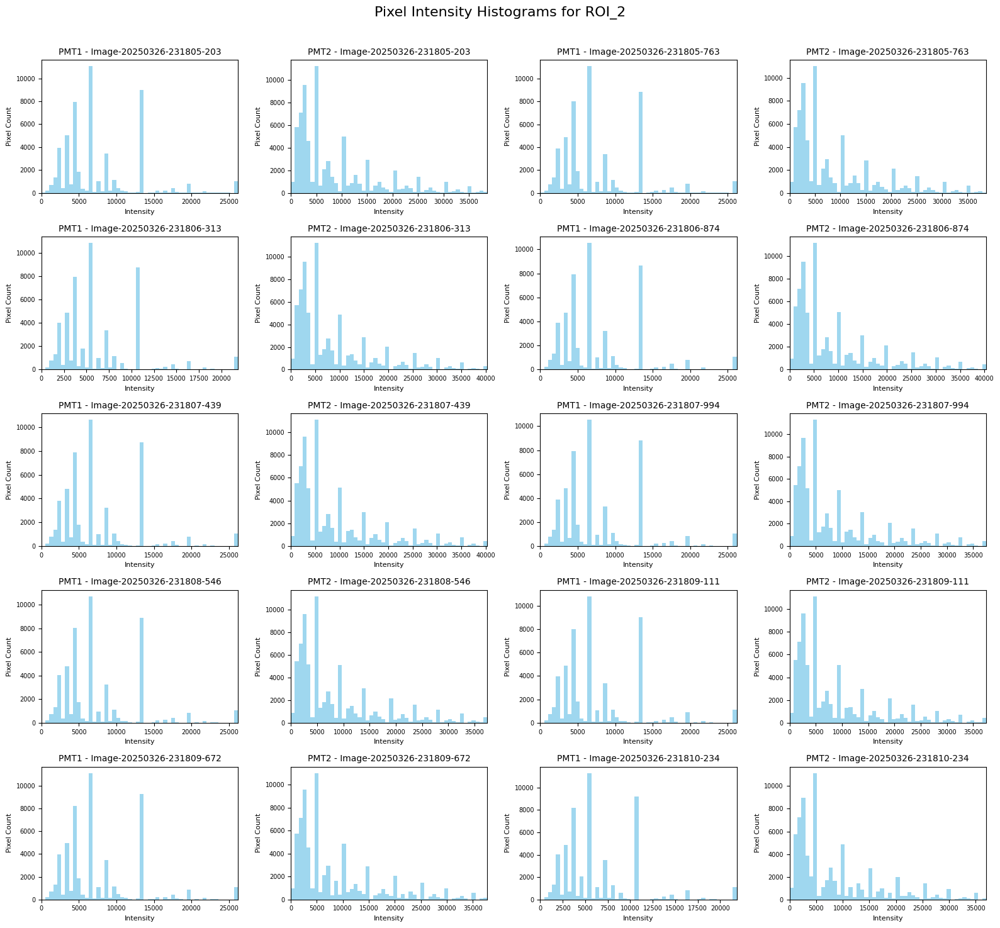

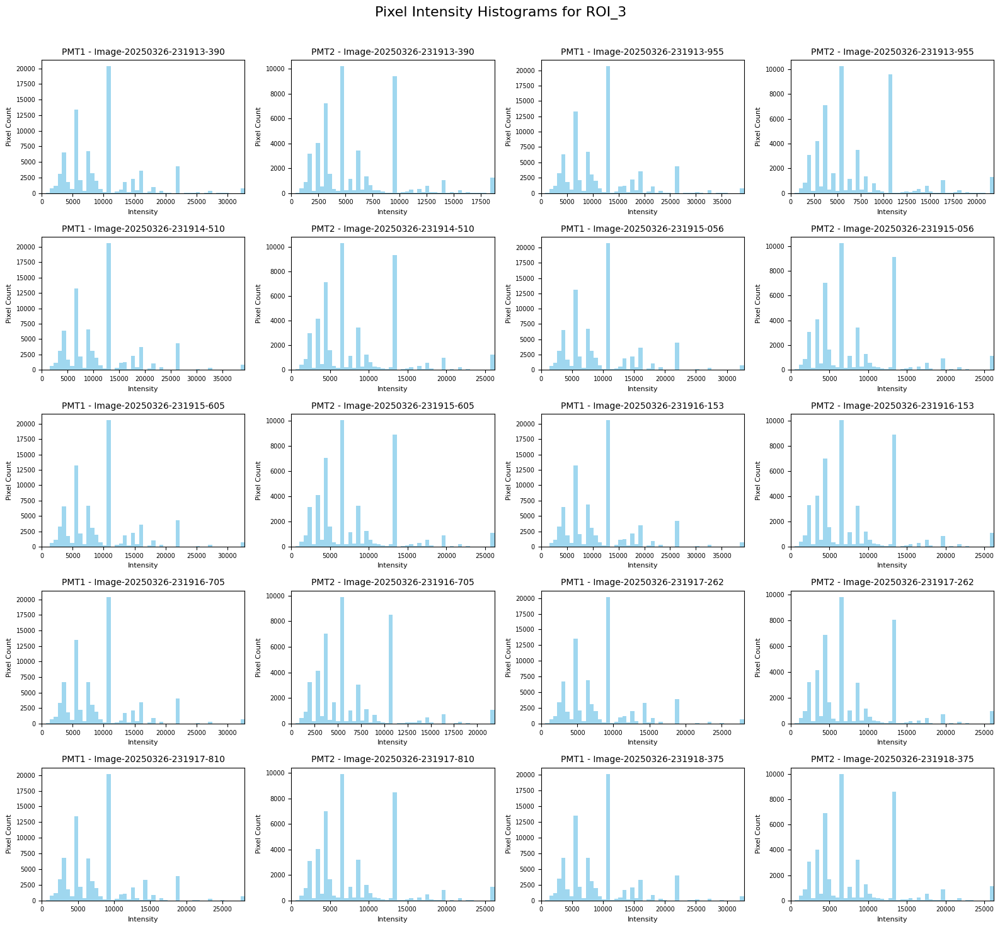

In [82]:
import matplotlib.pyplot as plt
import numpy as np

# 2 columns per image (PMT1, PMT2)
n_cols = 4  

# two plots per image
for roi, pairs in roi_image_pairs.items():
    n_images = len(pairs)
    n_rows = int(np.ceil(n_images / (n_cols // 2)))  

    fig, axs = plt.subplots(n_rows, n_cols, figsize=(n_cols * 4, n_rows * 3))
    fig.suptitle(f"Pixel Intensity Histograms for {roi}", fontsize=16)
    axs = axs.flatten()

    for i, (base_name, channels) in enumerate(pairs.items()):
        for j, channel in enumerate(["PMT1", "PMT2"]):
            img_path = channels[channel]
            metadata, img_array = get_image_metadata(img_path)

            ax_idx = i * 2 + j
            ax = axs[ax_idx]

            # Flatten the image and filter out 0-intensity pixels
            all_pixels = img_array.flatten()
            nonzero_pixels = all_pixels[all_pixels > 0]
            
            if len(nonzero_pixels) == 0:
                print(f"All pixels are 0 in {channel} - {base_name}.")
                continue

            # Use nonzero_pixels for computing percentile and histogram range
            upper_limit = np.percentile(nonzero_pixels, 99)

            ax.hist(nonzero_pixels, bins=50, color="skyblue", alpha=0.8, density=False, range=(0, upper_limit))
            ax.set_xlim(0, upper_limit)
            ax.set_title(f"{channel} - {base_name}", fontsize=10)
            ax.set_xlabel("Intensity", fontsize=8)
            ax.set_ylabel("Pixel Count", fontsize=8)
            ax.tick_params(axis='both', labelsize=7)

    for idx in range(n_images * 2, len(axs)):
        axs[idx].axis("off")

    plt.tight_layout(rect=[0, 0, 1, 0.97]) 
    plt.show()


Let's look at the general trend of pixel intensities across the PMTs for each ROI. These are for the background ignored histograms. 

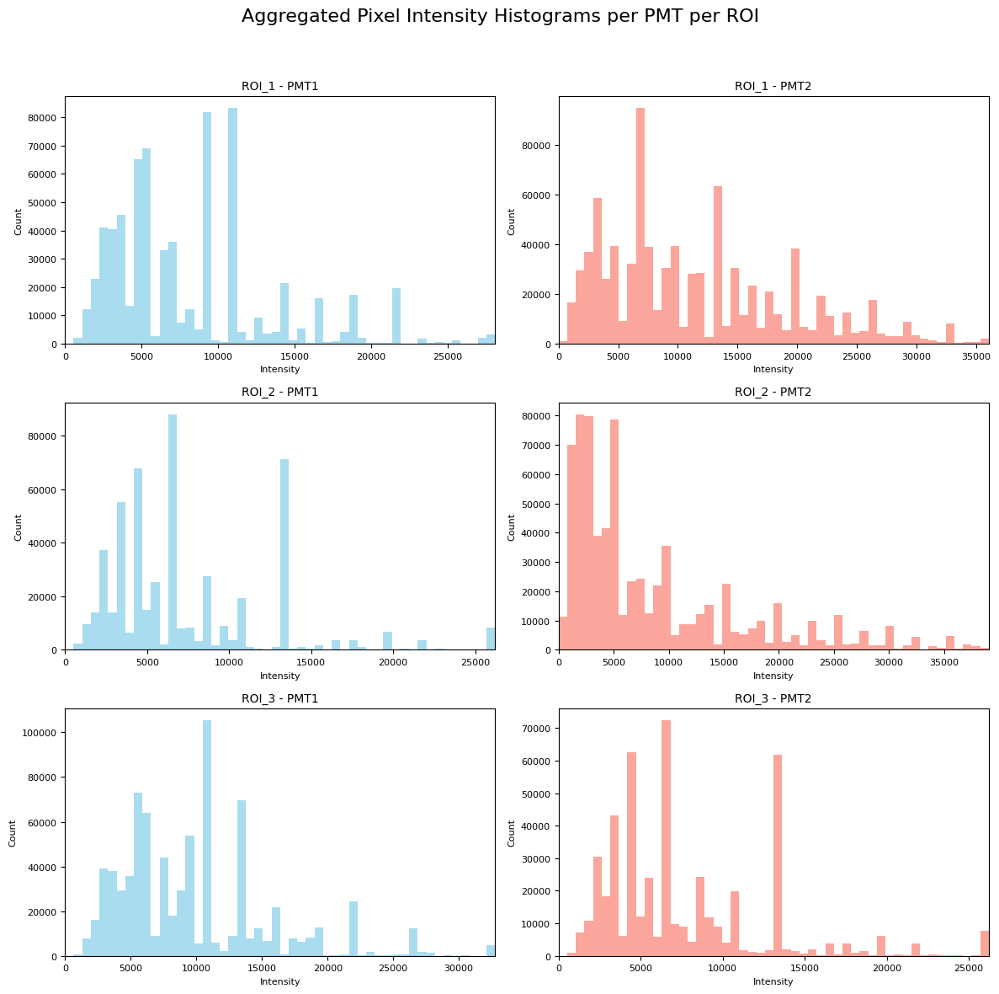

In [32]:
import matplotlib.pyplot as plt
import numpy as np

# Get a sorted list of ROIs (e.g., 'ROI_1', 'ROI_2', 'ROI_3')
roi_keys = sorted(roi_image_pairs.keys())

# Create a subplot grid: 3 rows (one per ROI) and 2 columns (one per PMT)
fig, axs = plt.subplots(nrows=len(roi_keys), ncols=2, figsize=(12, 4 * len(roi_keys)))
fig.suptitle("Aggregated Pixel Intensity Histograms per PMT per ROI", fontsize=16)

# Colors for each channel (you can change these as you like)
channel_colors = {"PMT1": "skyblue", "PMT2": "salmon"}

# Loop over ROIs and channels to aggregate data and plot
for row_idx, roi in enumerate(roi_keys):
    for col_idx, channel in enumerate(["PMT1", "PMT2"]):
        aggregated_pixels = []
        
        # Loop over each image pair in this ROI
        for base_name, channels in roi_image_pairs[roi].items():
            img_path = channels.get(channel)
            if img_path is None:
                continue
            
            # Retrieve metadata and the image array
            metadata, img_array = get_image_metadata(img_path)
            
            # Flatten the image and filter out background pixels (0 intensity)
            nonzero_pixels = img_array.flatten()[img_array.flatten() > 0]
            if nonzero_pixels.size > 0:
                aggregated_pixels.append(nonzero_pixels)
        
        # Combine pixel values from all images in this ROI for the current channel
        if aggregated_pixels:
            aggregated_pixels = np.concatenate(aggregated_pixels)
        else:
            aggregated_pixels = np.array([])

        # Plot histogram on the corresponding subplot
        ax = axs[row_idx, col_idx]
        if aggregated_pixels.size:
            # Define upper limit as the 99th percentile of the aggregated values
            upper_limit = np.percentile(aggregated_pixels, 99)
            
            # Plot the histogram using an appropriate range and color
            ax.hist(aggregated_pixels, bins=50, color=channel_colors[channel],
                    alpha=0.7, density=False, range=(0, upper_limit))
            ax.set_xlim(0, upper_limit)
        else:
            ax.text(0.5, 0.5, "No data", ha="center", va="center")
        
        ax.set_title(f"{roi} - {channel}", fontsize=10)
        ax.set_xlabel("Intensity", fontsize=8)
        ax.set_ylabel("Count", fontsize=8)
        ax.tick_params(axis="both", labelsize=8)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


Histograms above are the aggregates of pixels. In order to exhibit the pattern better, let's overlay the histograms. 

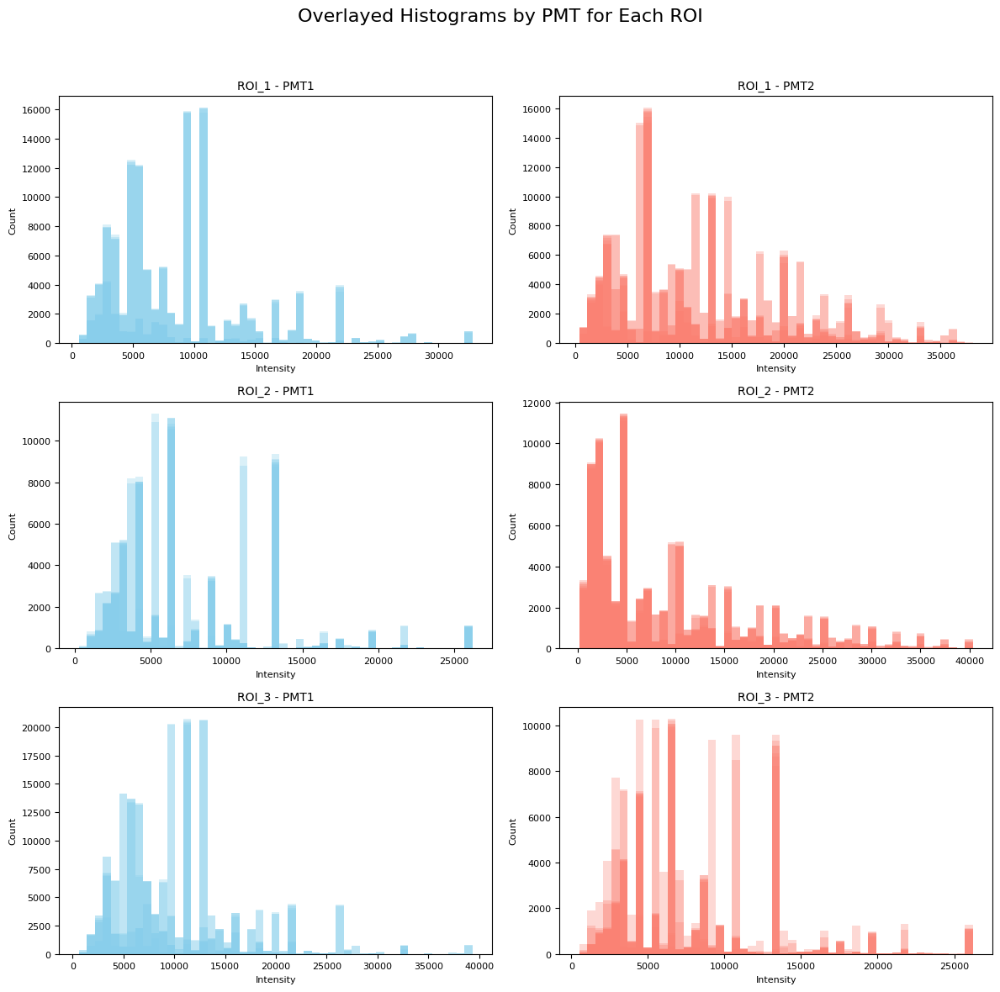

In [34]:
import matplotlib.pyplot as plt
import numpy as np

# Assume roi_image_pairs (a dict of ROI keys mapping to image pairs) 
# and get_image_metadata are already defined.

# Sort ROI keys (for example: "ROI_1", "ROI_2", "ROI_3")
roi_keys = sorted(roi_image_pairs.keys())

# Create a grid with 3 rows (one per ROI) and 2 columns (one per channel)
fig, axs = plt.subplots(nrows=len(roi_keys), ncols=2, figsize=(12, 4 * len(roi_keys)))
fig.suptitle("Overlayed Histograms by PMT for Each ROI", fontsize=16)

# Define colors for the channels
channel_colors = {"PMT1": "skyblue", "PMT2": "salmon"}

# Loop over each ROI and channel
for row_idx, roi in enumerate(roi_keys):
    for col_idx, channel in enumerate(["PMT1", "PMT2"]):
        ax = axs[row_idx, col_idx]
        
        # First, determine a common histogram range over all images for this ROI/channel.
        lower_bounds = []
        upper_bounds = []
        for base_name, chans in roi_image_pairs[roi].items():
            img_path = chans.get(channel)
            if img_path is None:
                continue
            metadata, img_array = get_image_metadata(img_path)
            # Flatten and filter out background zeros
            pixels = img_array.flatten()
            nonzero_pixels = pixels[pixels > 0]
            if nonzero_pixels.size > 0:
                lower_bounds.append(nonzero_pixels.min())
                upper_bounds.append(np.percentile(nonzero_pixels, 99))
        if not lower_bounds or not upper_bounds:
            ax.text(0.5, 0.5, "No data", ha="center", va="center")
            ax.set_title(f"{roi} - {channel}", fontsize=10)
            continue

        overall_min = min(lower_bounds)
        overall_max = max(upper_bounds)
        # Define common bins across the specified range (50 bins here)
        bins = np.linspace(overall_min, overall_max, 50)
        bin_width = bins[1] - bins[0]
        bin_centers = (bins[:-1] + bins[1:]) / 2
        
        # Now loop over all images in this ROI for the channel and plot each histogram
        for base_name, chans in roi_image_pairs[roi].items():
            img_path = chans.get(channel)
            if img_path is None:
                continue
            metadata, img_array = get_image_metadata(img_path)
            pixels = img_array.flatten()
            nonzero_pixels = pixels[pixels > 0]
            if nonzero_pixels.size == 0:
                continue
            # Compute the histogram for nonzero intensity pixels using the common bins
            hist, _ = np.histogram(nonzero_pixels, bins=bins)
            # Plot histogram as transparent bars for this image
            ax.bar(bin_centers, hist, width=bin_width, color=channel_colors[channel], 
                   alpha=0.3, align='center')
        
        # Set subplot labels and title
        ax.set_title(f"{roi} - {channel}", fontsize=10)
        ax.set_xlabel("Intensity", fontsize=8)
        ax.set_ylabel("Count", fontsize=8)
        ax.tick_params(axis="both", labelsize=8)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


To delve deeper into the pattern, let's output averages for all histograms & statistical measures for each.

Statistics for ROI_1 - PMT1:
  Mean: 8433.13
  Median: 7021.00
  Std Dev: 5913.98
  Coefficient of Variation: 0.701
  Skewness: 1.751
  Kurtosis: 4.795
----------------------------------------
Statistics for ROI_1 - PMT2:
  Mean: 11668.69
  Median: 9830.00
  Std Dev: 8222.62
  Coefficient of Variation: 0.705
  Skewness: 1.044
  Kurtosis: 1.003
----------------------------------------
Statistics for ROI_2 - PMT1:
  Mean: 7483.68
  Median: 6553.00
  Std Dev: 5313.80
  Coefficient of Variation: 0.710
  Skewness: 1.963
  Kurtosis: 6.456
----------------------------------------
Statistics for ROI_2 - PMT2:
  Mean: 8859.95
  Median: 5041.00
  Std Dev: 8889.84
  Coefficient of Variation: 1.003
  Skewness: 1.681
  Kurtosis: 2.705
----------------------------------------
Statistics for ROI_3 - PMT1:
  Mean: 9930.35
  Median: 8738.00
  Std Dev: 6223.11
  Coefficient of Variation: 0.627
  Skewness: 1.716
  Kurtosis: 5.057
----------------------------------------
Statistics for ROI_3 - PMT2:
  Mea

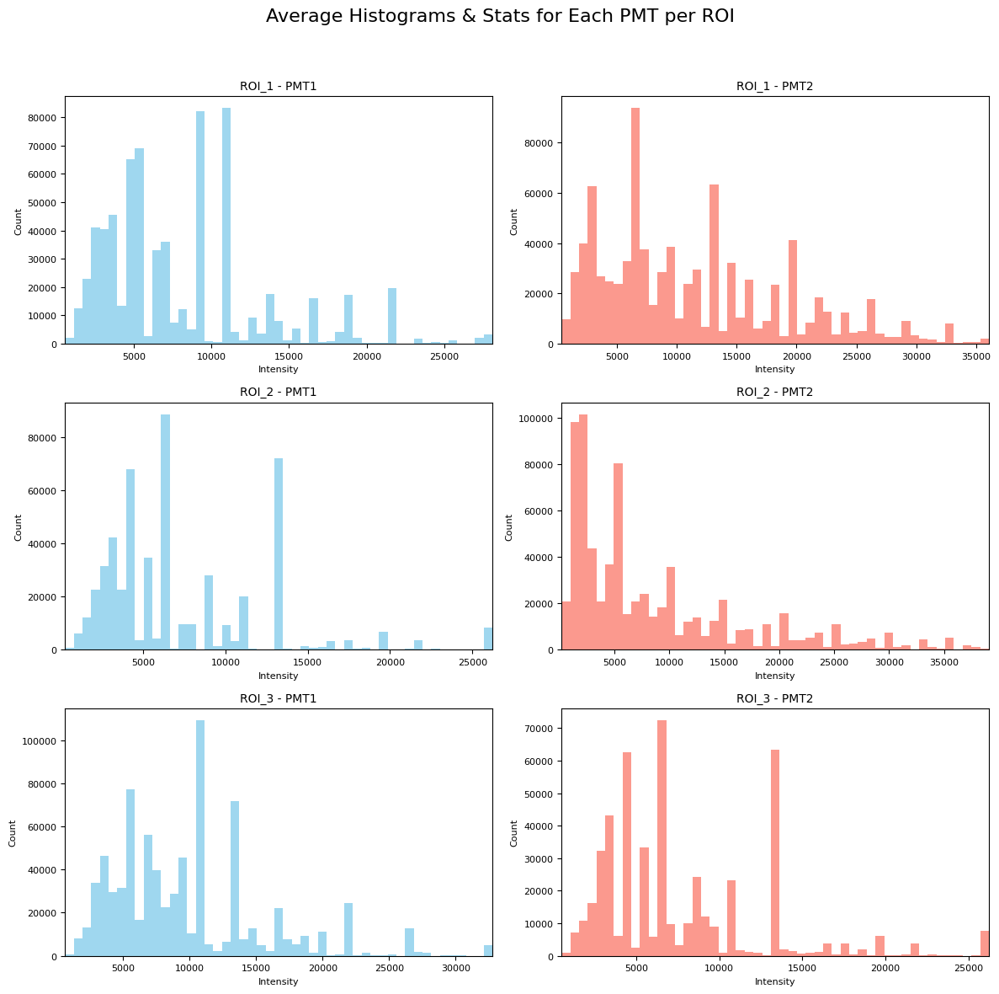

In [36]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import skew, kurtosis
from collections import defaultdict
from glob import glob

# Assuming the function get_image_metadata and roi_image_pairs are already defined.
# For example:
#
# def get_image_metadata(image_path):
#     with Image.open(image_path) as img:
#         img_array = np.array(img)
#         ...
#         return metadata, img_array
#
# And roi_image_pairs is a dictionary with keys like 'ROI_1', 'ROI_2', etc.

# Define colors for the channels
channel_colors = {"PMT1": "skyblue", "PMT2": "salmon"}

# Get sorted ROI keys (e.g., 'ROI_1', 'ROI_2', 'ROI_3')
roi_keys = sorted(roi_image_pairs.keys())

# Create a grid: 3 rows (one for each ROI) x 2 columns (one for each PMT)
fig, axs = plt.subplots(nrows=len(roi_keys), ncols=2, figsize=(12, 4 * len(roi_keys)))
fig.suptitle("Average Histograms & Stats for Each PMT per ROI", fontsize=16)

# Loop over each ROI and each channel (PMT1, PMT2)
for row_idx, roi in enumerate(roi_keys):
    for col_idx, channel in enumerate(["PMT1", "PMT2"]):
        ax = axs[row_idx, col_idx]
        aggregated_pixels = []
        
        # Aggregate nonzero pixel values for all images in this ROI for the given channel
        for base_name, chans in roi_image_pairs[roi].items():
            img_path = chans.get(channel)
            if img_path is None:
                continue
            metadata, img_array = get_image_metadata(img_path)
            # Flatten and filter out 0 intensity pixels (background)
            pixels = img_array.flatten()
            nonzero_pixels = pixels[pixels > 0]
            if nonzero_pixels.size > 0:
                aggregated_pixels.append(nonzero_pixels)
        
        if len(aggregated_pixels) == 0:
            ax.text(0.5, 0.5, "No data", ha="center", va="center")
            ax.set_title(f"{roi} - {channel}", fontsize=10)
            continue
        
        # Concatenate data from all images
        aggregated_pixels = np.concatenate(aggregated_pixels)
        
        # Compute statistics
        mean_val = np.mean(aggregated_pixels)
        median_val = np.median(aggregated_pixels)
        std_val = np.std(aggregated_pixels)
        cv = std_val / mean_val if mean_val != 0 else np.nan
        skew_val = skew(aggregated_pixels)
        kurt_val = kurtosis(aggregated_pixels)
        
        # Print stats
        print(f"Statistics for {roi} - {channel}:")
        print(f"  Mean: {mean_val:.2f}")
        print(f"  Median: {median_val:.2f}")
        print(f"  Std Dev: {std_val:.2f}")
        print(f"  Coefficient of Variation: {cv:.3f}")
        print(f"  Skewness: {skew_val:.3f}")
        print(f"  Kurtosis: {kurt_val:.3f}")
        print("-" * 40)
        
        # Define common bins from the minimum to the 99th percentile (to reduce extreme outlier influence)
        lower_bound = aggregated_pixels.min()
        upper_bound = np.percentile(aggregated_pixels, 99)
        bins = np.linspace(lower_bound, upper_bound, 50)
        bin_width = bins[1] - bins[0]
        bin_centers = (bins[:-1] + bins[1:]) / 2
        
        # Plot the histogram using transparent bars
        ax.bar(bin_centers, 
               np.histogram(aggregated_pixels, bins=bins)[0],
               width=bin_width,
               color=channel_colors[channel],
               alpha=0.8,
               align='center')
        ax.set_title(f"{roi} - {channel}", fontsize=10)
        ax.set_xlabel("Intensity", fontsize=8)
        ax.set_ylabel("Count", fontsize=8)
        ax.set_xlim(lower_bound, upper_bound)
        ax.tick_params(axis='both', labelsize=8)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


These averages exhibit: 


Now let's plot the individual histograms again but with the background signal on a log scale. A log scale compresses the tall bars and stretches the short ones, making it easier to see the full distribution.

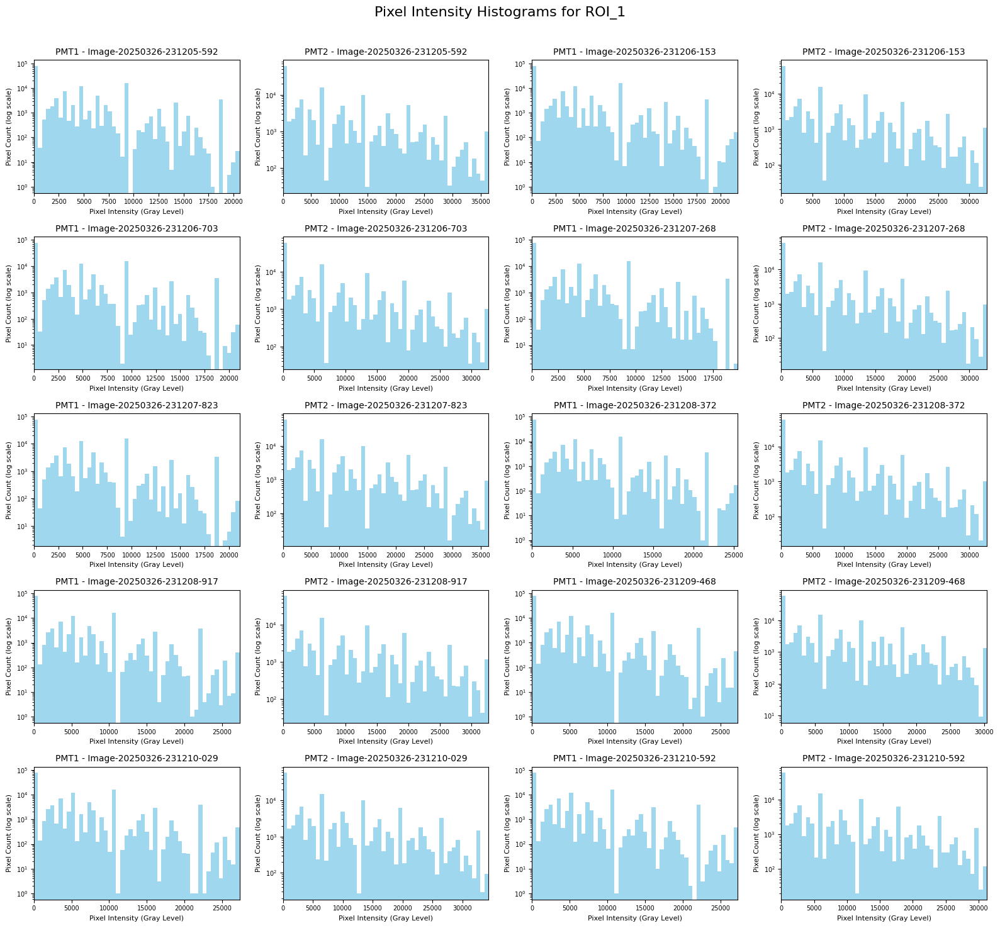

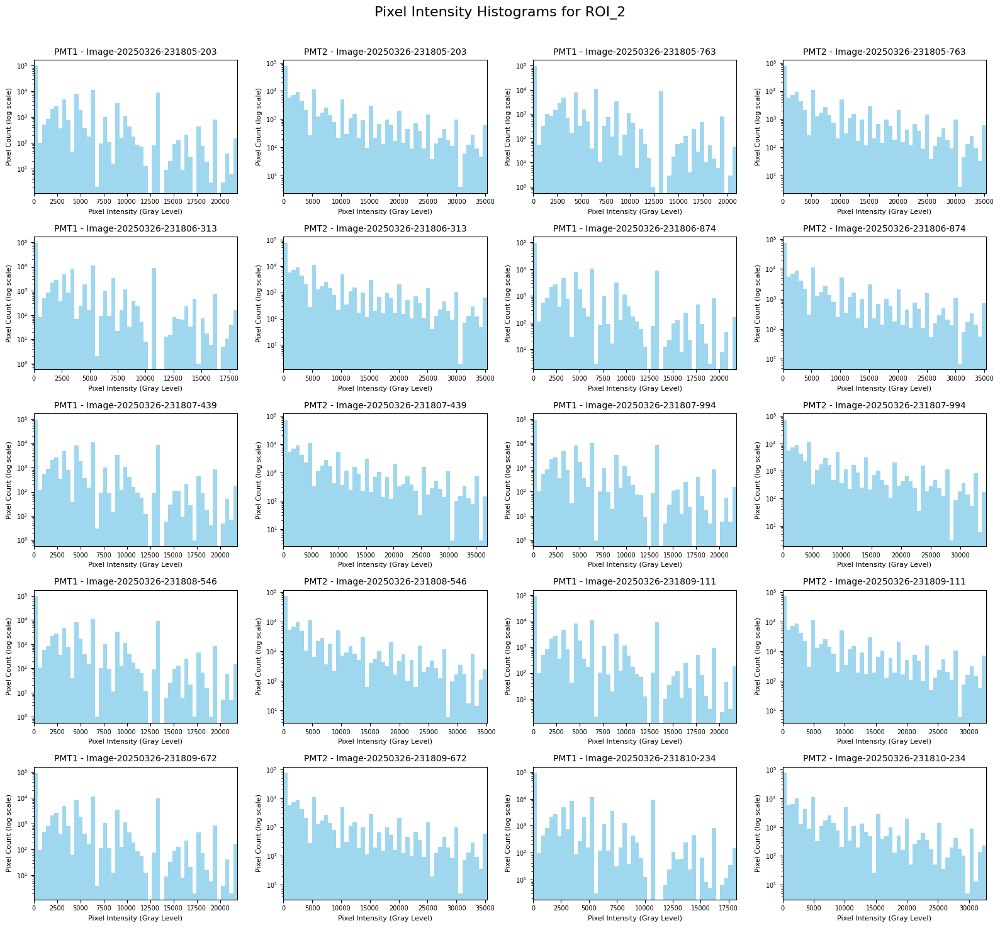

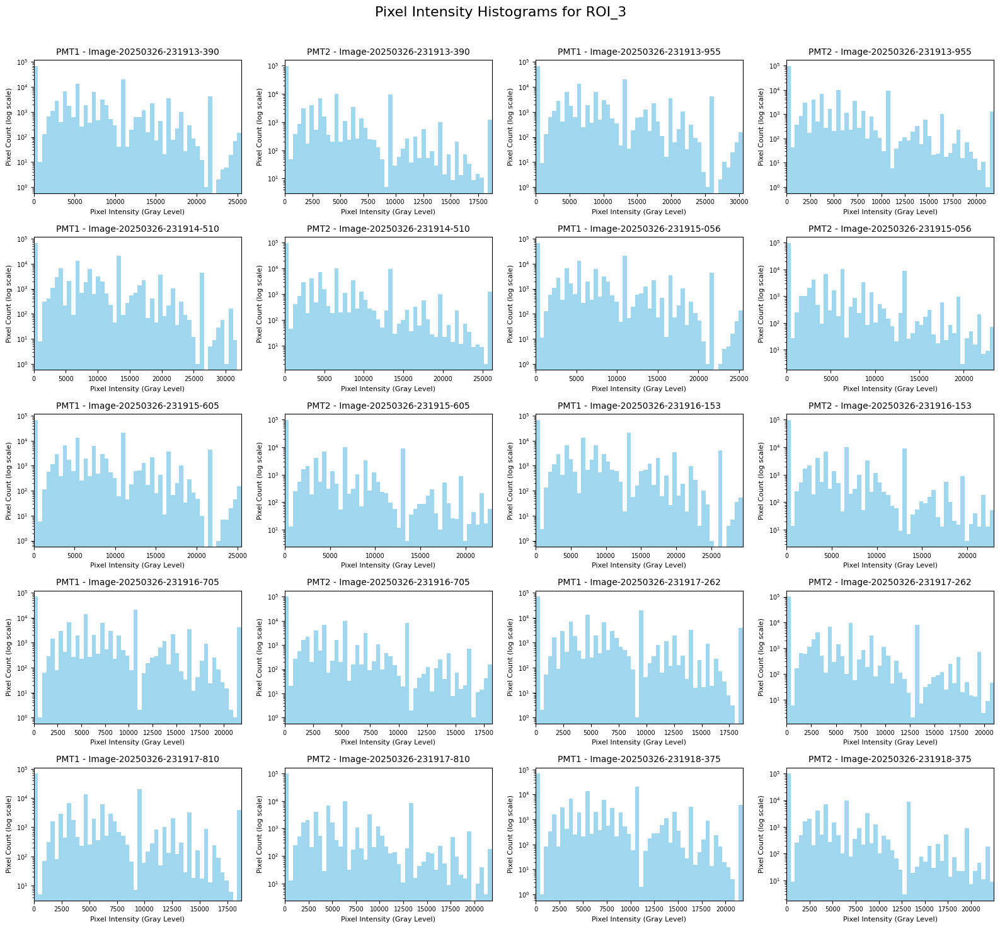

In [18]:
import matplotlib.pyplot as plt
import numpy as np

# Choose number of columns: 2 per image (PMT1, PMT2)
n_cols = 4  # 2 images per row (each with PMT1 and PMT2)

for roi, pairs in roi_image_pairs.items():
    n_images = len(pairs)
    n_rows = int(np.ceil(n_images / (n_cols // 2)))  # two plots per image

    fig, axs = plt.subplots(n_rows, n_cols, figsize=(n_cols * 4, n_rows * 3))
    fig.suptitle(f"Pixel Intensity Histograms for {roi}", fontsize=16)
    axs = axs.flatten()

    for i, (base_name, channels) in enumerate(pairs.items()):
        for j, channel in enumerate(["PMT1", "PMT2"]):
            img_path = channels[channel]
            metadata, img_array = get_image_metadata(img_path)

            ax_idx = i * 2 + j
            ax = axs[ax_idx]

            all_pixels = img_array.flatten()
            upper_limit = np.percentile(all_pixels, 99)

            # Plot pixel count (not density)
            ax.hist(all_pixels, bins=50, color="skyblue", alpha=0.8, density=False, range=(0, upper_limit))
            ax.set_xlim(0, upper_limit)
            ax.set_yscale('log')  # <-- Log scale on Y-axis
            ax.set_title(f"{channel} - {base_name}", fontsize=10)
            ax.set_xlabel("Pixel Intensity (Gray Level)", fontsize=8)
            ax.set_ylabel("Pixel Count (log scale)", fontsize=8)
            ax.tick_params(axis='both', labelsize=7)

    # Hide any unused subplots
    for idx in range(n_images * 2, len(axs)):
        axs[idx].axis("off")

    plt.tight_layout(rect=[0, 0, 1, 0.97])  # leave space for suptitle
    plt.show()


Now average the histograms without having the background removed and the y axis log.


🎨 ROI: ROI_1 (Color: tomato)

📷 PMT1 Summary Stats:
  Mean: 4005.34
  Median: 0.00
  Std Dev: 5860.58
  Coefficient of Variation: 1.463
  Skewness: 1.988
  Kurtosis: 5.347

📷 PMT2 Summary Stats:
  Mean: 6957.46
  Median: 3640.00
  Std Dev: 8549.36
  Coefficient of Variation: 1.229
  Skewness: 1.348
  Kurtosis: 1.500


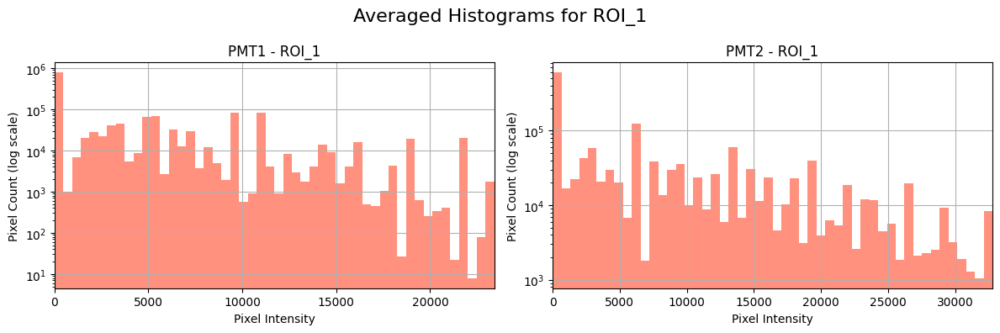


🎨 ROI: ROI_2 (Color: mediumseagreen)

📷 PMT1 Summary Stats:
  Mean: 2655.34
  Median: 0.00
  Std Dev: 4779.09
  Coefficient of Variation: 1.800
  Skewness: 2.542
  Kurtosis: 9.114

📷 PMT2 Summary Stats:
  Mean: 4384.53
  Median: 0.00
  Std Dev: 7663.67
  Coefficient of Variation: 1.748
  Skewness: 2.469
  Kurtosis: 6.619


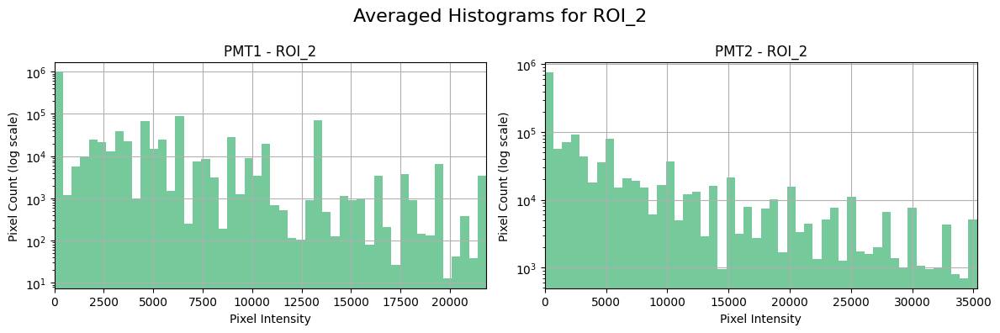


🎨 ROI: ROI_3 (Color: royalblue)

📷 PMT1 Summary Stats:
  Mean: 5322.84
  Median: 3120.00
  Std Dev: 6729.30
  Coefficient of Variation: 1.264
  Skewness: 1.612
  Kurtosis: 3.740

📷 PMT2 Summary Stats:
  Mean: 2604.44
  Median: 0.00
  Std Dev: 4829.81
  Coefficient of Variation: 1.854
  Skewness: 2.565
  Kurtosis: 9.190


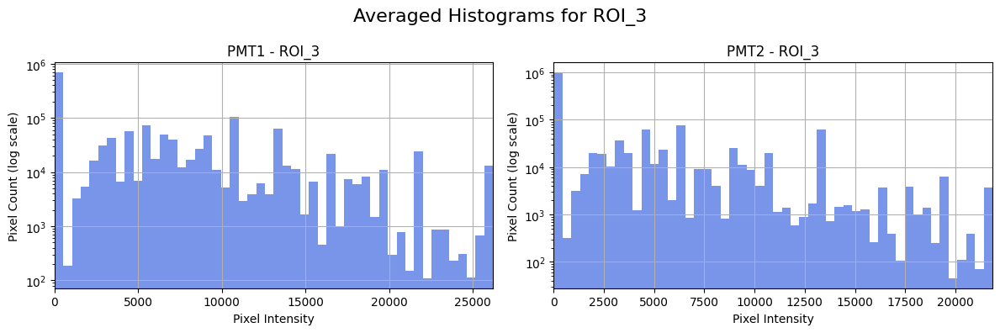

In [40]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import skew, kurtosis
from PIL import Image
import os
from collections import defaultdict

# Define ROI colors
roi_colors = {
    "ROI_1": "tomato",
    "ROI_2": "mediumseagreen",
    "ROI_3": "royalblue"
}

# Store pixel data
pixel_data_by_roi = defaultdict(lambda: {'PMT1': [], 'PMT2': []})

# Collect pixel values
for roi, pairs in roi_image_pairs.items():
    for base_name, channels in pairs.items():
        for channel in ["PMT1", "PMT2"]:
            img_path = channels.get(channel)
            if img_path and os.path.exists(img_path):
                with Image.open(img_path) as img:
                    pixels = np.array(img).flatten()
                    pixel_data_by_roi[roi][channel].append(pixels)

# Plot averaged, color-coded histograms + summary stats
for roi, data in pixel_data_by_roi.items():
    color = roi_colors.get(roi, "gray")
    print(f"\n🎨 ROI: {roi} (Color: {color})")

    fig, axs = plt.subplots(1, 2, figsize=(12, 4))
    fig.suptitle(f"Averaged Histograms for {roi}", fontsize=16)

    for i, channel in enumerate(["PMT1", "PMT2"]):
        all_pixels = np.concatenate(data[channel])
        
        upper_limit = np.percentile(all_pixels, 99)  # or use 100 for max

        axs[i].hist(
            all_pixels,
            bins=50,
            color=color,
            alpha=0.7,
            density=False,
            range=(0, upper_limit)
        )
        axs[i].set_xlim(0, upper_limit)
        axs[i].set_yscale("log")  # <-- Log scale on Y-axis
        axs[i].set_title(f"{channel} - {roi}")
        axs[i].set_xlabel("Pixel Intensity")
        axs[i].set_ylabel("Pixel Count (log scale)")
        axs[i].grid(True)

        # Summary statistics
        mean_val = np.mean(all_pixels)
        median_val = np.median(all_pixels)
        std_val = np.std(all_pixels)
        cv = std_val / mean_val if mean_val else 0
        skew_val = skew(all_pixels)
        kurt_val = kurtosis(all_pixels)

        print(f"\n📷 {channel} Summary Stats:")
        print(f"  Mean: {mean_val:.2f}")
        print(f"  Median: {median_val:.2f}")
        print(f"  Std Dev: {std_val:.2f}")
        print(f"  Coefficient of Variation: {cv:.3f}")
        print(f"  Skewness: {skew_val:.3f}")
        print(f"  Kurtosis: {kurt_val:.3f}")

    plt.tight_layout()
    plt.show()


Step#3: Data Manipulation 

a) Histogram Equalization

First, histograms without the background signal are equalised for a random image and the impact is visualized.

Randomly selected scan: Image-20250326-231915-056 in ROI: ROI_3


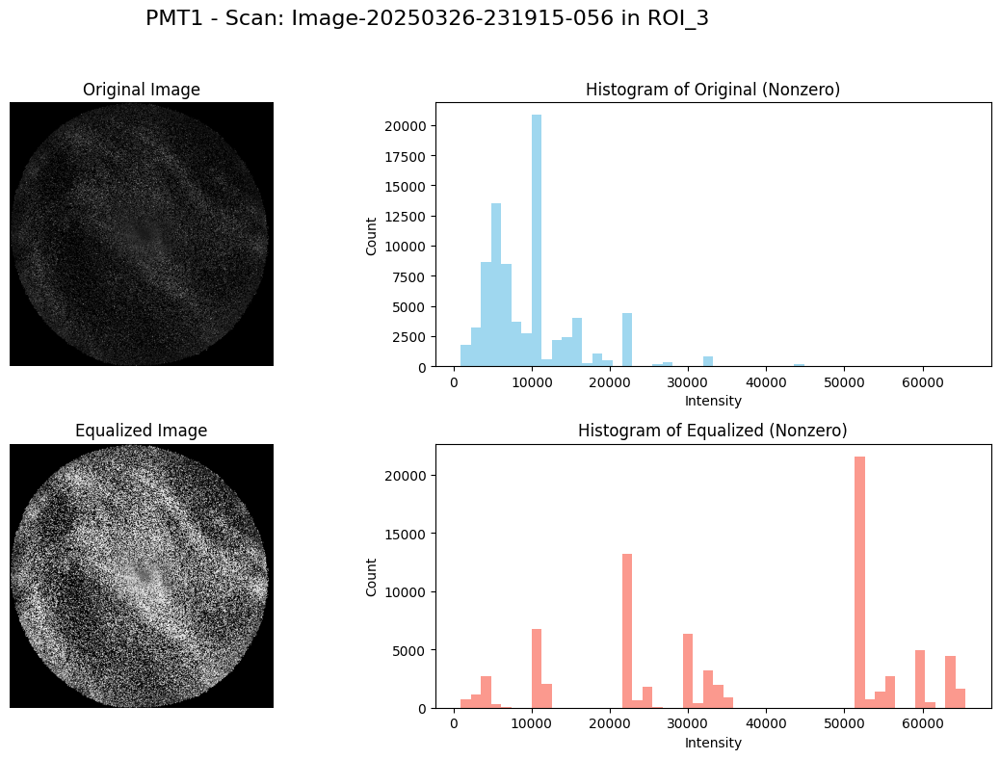

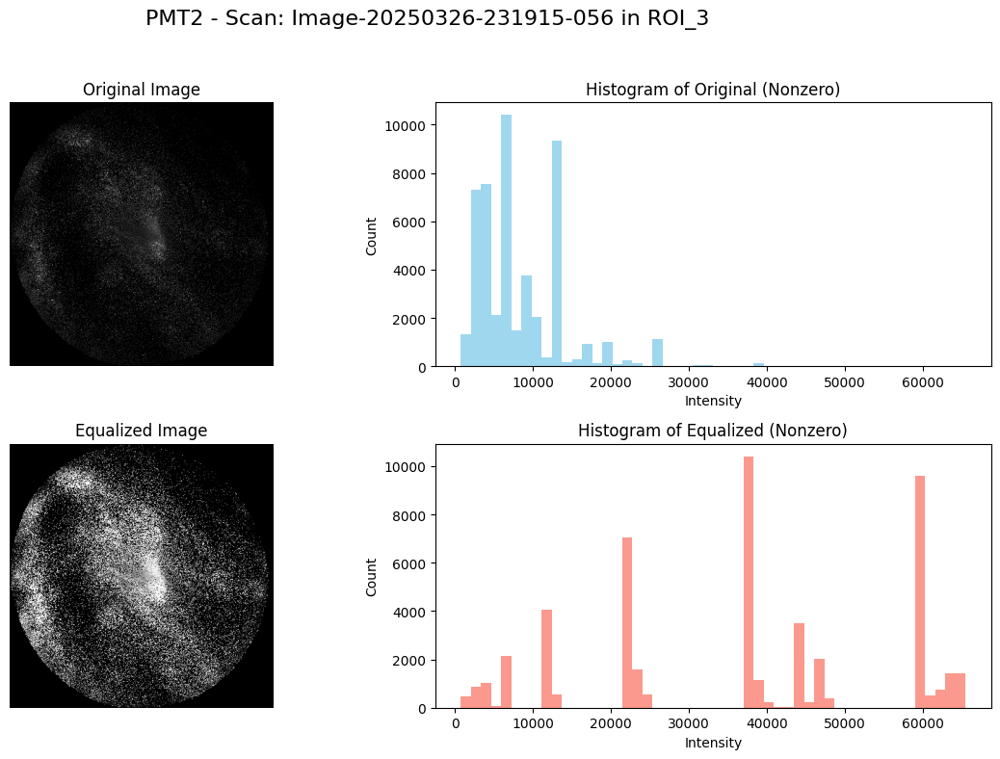

In [41]:
import random
import matplotlib.pyplot as plt
import numpy as np

# Define a histogram equalization function that only modifies nonzero pixels.
def equalize_histogram(image):
    """
    Perform histogram equalization on an image while keeping 0-intensity pixels (background) unchanged.
    
    Parameters:
        image (np.ndarray): Input image as a NumPy array.
        
    Returns:
        np.ndarray: Histogram-equalized image.
    """
    # Convert image to float64 for precision in computation
    eq_img = image.copy().astype(np.float64)
    # Create a mask for nonzero (signal) pixels
    mask = (eq_img > 0)
    if np.count_nonzero(mask) == 0:
        return eq_img

    # Extract nonzero pixel values
    pixels = eq_img[mask]
    
    # Compute histogram with 256 bins; you may adjust the bins as needed.
    hist, bins = np.histogram(pixels, bins=256, density=True)
    cdf = hist.cumsum()  # cumulative distribution function
    cdf_normalized = cdf / cdf[-1]  # Normalize to [0,1]
    
    # Map the original pixel values to equalized values via interpolation.
    # We use bins[:-1] because np.histogram returns one more bin edge than counts.
    eq_pixels = np.interp(pixels, bins[:-1], cdf_normalized * (bins[-1] - bins[0]) + bins[0])
    eq_img[mask] = eq_pixels
    # Return the equalized image (same shape, 0's remain 0)
    return eq_img

# Choose a random image scan from the organised dictionary.
roi_choice = random.choice(list(roi_image_pairs.keys()))
scan_choice = random.choice(list(roi_image_pairs[roi_choice].keys()))
channels = roi_image_pairs[roi_choice][scan_choice]
print(f"Randomly selected scan: {scan_choice} in ROI: {roi_choice}")

# Process each channel (PMT1 and PMT2) for the randomly selected scan.
results = {}
for channel in ["PMT1", "PMT2"]:
    img_path = channels.get(channel)
    if img_path is None:
        continue
    # Retrieve metadata and the image array.
    metadata, img_array = get_image_metadata(img_path)
    # Compute the histogram-equalized image.
    eq_img = equalize_histogram(img_array)
    results[channel] = {'original': img_array, 'equalized': eq_img}

# For each channel, plot a 2x2 grid:
#   Top left: original image, Top right: histogram of original (nonzero pixels),
#   Bottom left: equalized image, Bottom right: histogram of equalized (nonzero pixels).
for channel in results.keys():
    orig = results[channel]['original']
    eq = results[channel]['equalized']
    
    # Filter out 0-intensity pixels for histogram plotting.
    orig_nonzero = orig[orig > 0]
    eq_nonzero = eq[eq > 0]
    
    fig, axs = plt.subplots(2, 2, figsize=(12, 8))
    fig.suptitle(f"{channel} - Scan: {scan_choice} in {roi_choice}", fontsize=16)
    
    # Display the original image.
    axs[0, 0].imshow(orig, cmap='gray')
    axs[0, 0].set_title("Original Image")
    axs[0, 0].axis("off")
    
    # Display the histogram for the original image.
    axs[0, 1].hist(orig_nonzero, bins=50, color='skyblue', alpha=0.8)
    axs[0, 1].set_title("Histogram of Original (Nonzero)")
    axs[0, 1].set_xlabel("Intensity")
    axs[0, 1].set_ylabel("Count")
    
    # Display the equalized image.
    axs[1, 0].imshow(eq, cmap='gray')
    axs[1, 0].set_title("Equalized Image")
    axs[1, 0].axis("off")
    
    # Display the histogram for the equalized image.
    axs[1, 1].hist(eq_nonzero, bins=50, color='salmon', alpha=0.8)
    axs[1, 1].set_title("Histogram of Equalized (Nonzero)")
    axs[1, 1].set_xlabel("Intensity")
    axs[1, 1].set_ylabel("Count")
    
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


Then, histograms with the background signal are equalised for the same image as above and the impact is visualized.

Using scan: Image-20250326-231915-056 in ROI: ROI_3


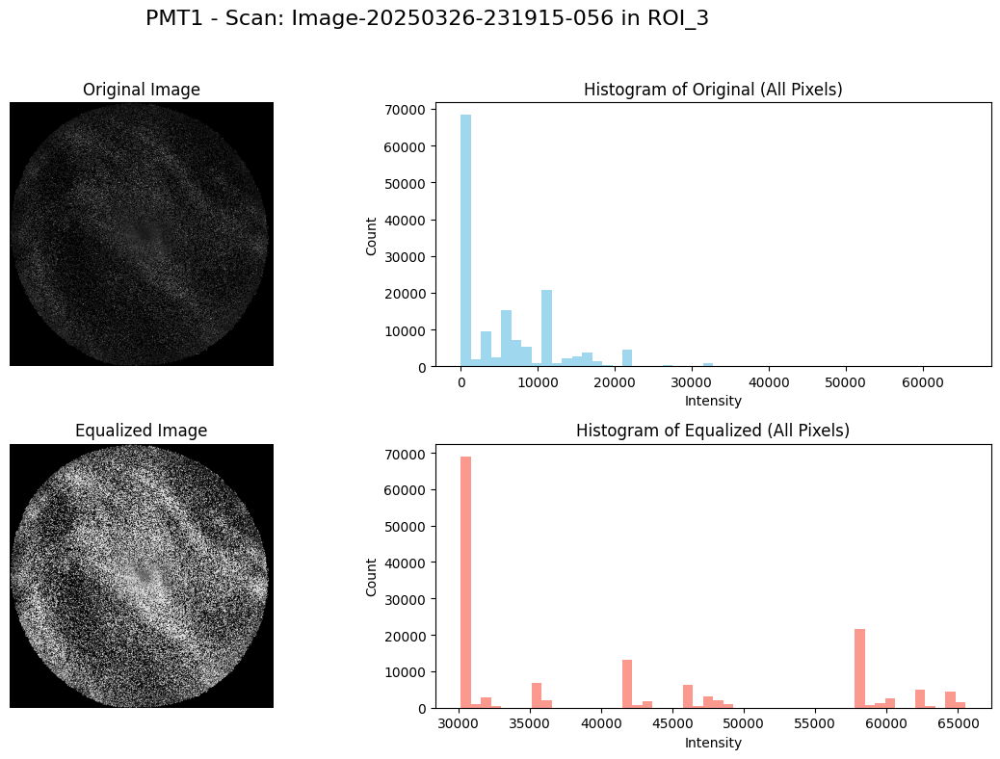

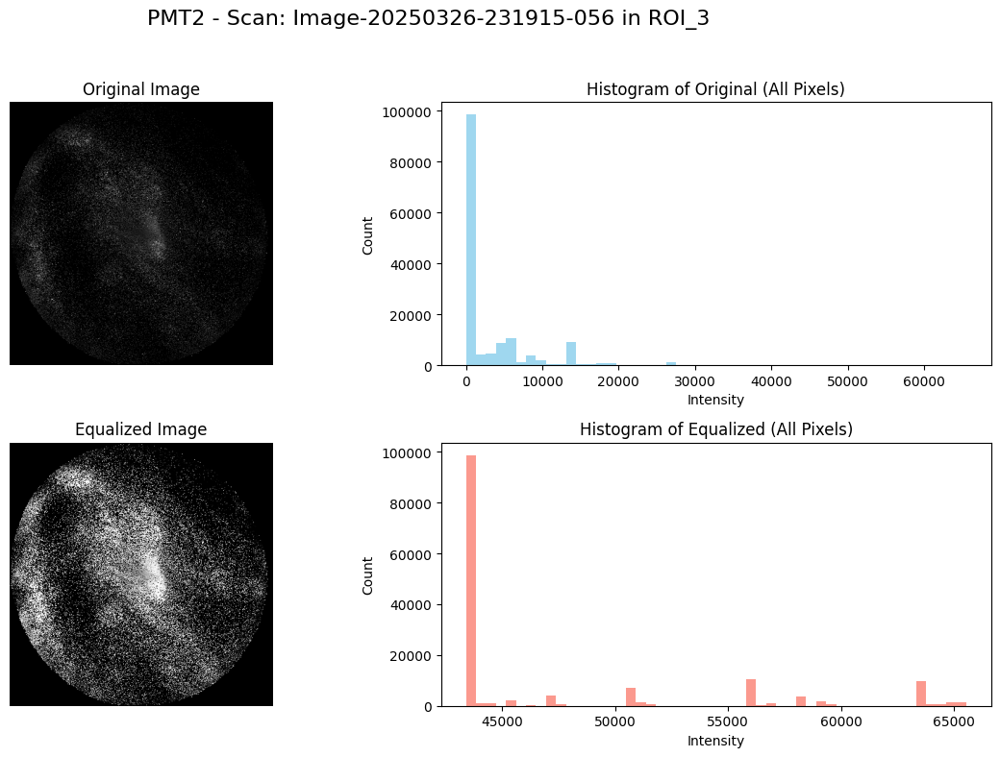

In [43]:
import matplotlib.pyplot as plt
import numpy as np

# Modified histogram equalization function that includes 0-intensity pixels.
def equalize_histogram_full(image):
    """
    Perform histogram equalization on the entire image (including 0-intensity pixels).
    
    Parameters:
        image (np.ndarray): Input image as a NumPy array.
        
    Returns:
        np.ndarray: Histogram-equalized image.
    """
    # Work in float64 for precision
    eq_img = image.copy().astype(np.float64)
    
    # Flatten entire image (including zeros)
    pixels = eq_img.flatten()
    
    # Compute histogram over 256 bins
    hist, bins = np.histogram(pixels, bins=256, density=True)
    cdf = hist.cumsum()  # cumulative distribution function
    cdf_normalized = cdf / cdf[-1]  # Normalize to [0, 1]
    
    # Map the original pixel values to equalized values via interpolation.
    eq_pixels = np.interp(pixels, bins[:-1], cdf_normalized * (bins[-1] - bins[0]) + bins[0])
    
    # Reshape to the original image shape
    eq_img = eq_pixels.reshape(eq_img.shape)
    return eq_img

# Set the specific desired scan base name.
desired_base = "Image-20250326-231915-056"

# Locate the desired scan within the roi_image_pairs dictionary.
found = False
for roi, scans in roi_image_pairs.items():
    if desired_base in scans:
        roi_choice = roi
        scan_choice = desired_base
        channels = scans[desired_base]
        found = True
        break

if not found:
    print(f"Scan with base '{desired_base}' not found in the dataset.")
else:
    print(f"Using scan: {scan_choice} in ROI: {roi_choice}")
    
    # Process each channel (PMT1 and PMT2) for the specified scan.
    results = {}
    for channel in ["PMT1", "PMT2"]:
        img_path = channels.get(channel)
        if img_path is None:
            continue
        # Retrieve metadata and the image array.
        metadata, img_array = get_image_metadata(img_path)
        # Compute the histogram-equalized image including 0 intensity pixels.
        eq_img = equalize_histogram_full(img_array)
        results[channel] = {'original': img_array, 'equalized': eq_img}

    # For each channel, plot a 2x2 grid:
    #   Top left: original image, Top right: histogram of original (all pixels),
    #   Bottom left: equalized image, Bottom right: histogram of equalized (all pixels).
    for channel in results.keys():
        orig = results[channel]['original']
        eq = results[channel]['equalized']

        # Flatten the entire images for histogram plotting (including 0's)
        orig_flat = orig.flatten()
        eq_flat = eq.flatten()

        fig, axs = plt.subplots(2, 2, figsize=(12, 8))
        fig.suptitle(f"{channel} - Scan: {scan_choice} in {roi_choice}", fontsize=16)

        # Display the original image.
        axs[0, 0].imshow(orig, cmap='gray')
        axs[0, 0].set_title("Original Image")
        axs[0, 0].axis("off")

        # Display the histogram for the original image (all pixels).
        axs[0, 1].hist(orig_flat, bins=50, color='skyblue', alpha=0.8)
        axs[0, 1].set_title("Histogram of Original (All Pixels)")
        axs[0, 1].set_xlabel("Intensity")
        axs[0, 1].set_ylabel("Count")

        # Display the equalized image.
        axs[1, 0].imshow(eq, cmap='gray')
        axs[1, 0].set_title("Equalized Image")
        axs[1, 0].axis("off")

        # Display the histogram for the equalized image (all pixels).
        axs[1, 1].hist(eq_flat, bins=50, color='salmon', alpha=0.8)
        axs[1, 1].set_title("Histogram of Equalized (All Pixels)")
        axs[1, 1].set_xlabel("Intensity")
        axs[1, 1].set_ylabel("Count")

        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()


Let's visualise all the images side by side for comparison.

Using scan: Image-20250326-231915-056 in ROI: ROI_3


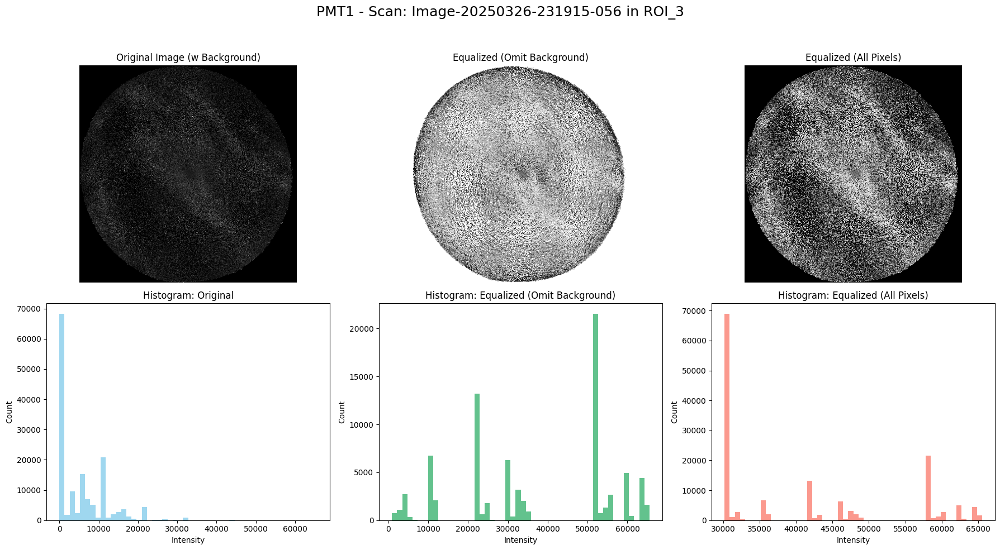

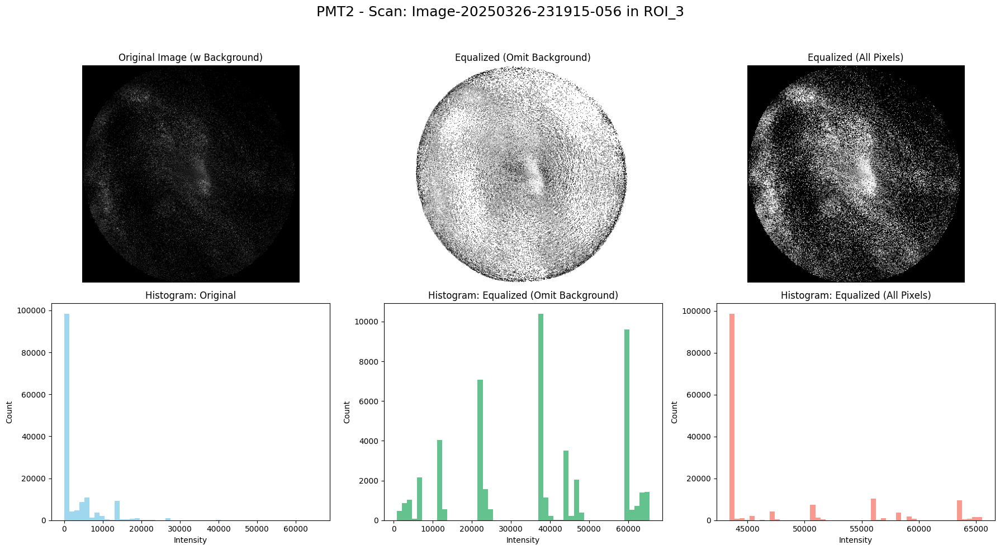

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Function to perform histogram equalization on nonzero pixels,
# then omit (replace) background pixels (i.e. those that are zero) with NaN.
def equalize_histogram_omit_zero(image):
  
    eq_img = image.copy().astype(np.float64)
    # Create a mask for nonzero pixels (signal)
    mask = eq_img > 0
    if np.count_nonzero(mask) == 0:
        # If there are no nonzero pixels, return the image with NaN.
        return np.full(eq_img.shape, np.nan)
    # Extract the nonzero pixels
    pixels = eq_img[mask]
    # Compute histogram on nonzero pixels only
    hist, bins = np.histogram(pixels, bins=256, density=True)
    cdf = hist.cumsum()   # cumulative distribution function
    cdf_normalized = cdf / cdf[-1]
    # Interpolate new pixel values based on the CDF
    eq_pixels = np.interp(pixels, bins[:-1], cdf_normalized * (bins[-1] - bins[0]) + bins[0])
    # Update only the nonzero pixels with their equalized values
    eq_img[mask] = eq_pixels
    # Now, omit the background by setting all original 0's to NaN
    eq_img[~mask] = np.nan
    return eq_img

# Function to perform histogram equalization on all pixels (including background)
def equalize_histogram_full(image)
    eq_img = image.copy().astype(np.float64)
    pixels = eq_img.flatten()
    hist, bins = np.histogram(pixels, bins=256, density=True)
    cdf = hist.cumsum()
    cdf_normalized = cdf / cdf[-1]
    eq_pixels = np.interp(pixels, bins[:-1], cdf_normalized * (bins[-1] - bins[0]) + bins[0])
    eq_img = eq_pixels.reshape(eq_img.shape)
    return eq_img

# Select the specific scan "Image-20250326-231915-056" from roi_image_pairs
desired_base = "Image-20250326-231915-056"
found = False
for roi, scans in roi_image_pairs.items():
    if desired_base in scans:
        roi_choice = roi
        scan_choice = desired_base
        channels = scans[desired_base]
        found = True
        break

if not found:
    print(f"Scan with base '{desired_base}' not found in the dataset.")
else:
    print(f"Using scan: {scan_choice} in ROI: {roi_choice}")
    
    # Process each channel (PMT1 and PMT2)
    for channel in ["PMT1", "PMT2"]:
        img_path = channels.get(channel)
        if img_path is None:
            continue
        
        # Get the original image.
        metadata, orig = get_image_metadata(img_path)
        
        # Compute histogram equalization in two ways:
        # 1. Process nonzero pixels and omit background (set them to NaN).
        eq_omit = equalize_histogram_omit_zero(orig)
        # 2. Process all pixels (including background).
        eq_full = equalize_histogram_full(orig)
        
        # Flatten the images for histogram plotting (using all pixels, including background)
        orig_flat = orig.flatten()
        eq_omit_flat = eq_omit.flatten()
        eq_full_flat = eq_full.flatten()
        
        # Create a figure with two rows and three columns.
        fig, axs = plt.subplots(2, 3, figsize=(18, 10))
        fig.suptitle(f"{channel} - Scan: {scan_choice} in {roi_choice}", fontsize=18)
        
        # Row 1: Image display
        axs[0, 0].imshow(orig, cmap='gray')
        axs[0, 0].set_title("Original Image (w Background)")
        axs[0, 0].axis("off")
        
        axs[0, 1].imshow(eq_omit, cmap='gray')
        axs[0, 1].set_title("Equalized (Omit Background)")
        axs[0, 1].axis("off")
        
        axs[0, 2].imshow(eq_full, cmap='gray')
        axs[0, 2].set_title("Equalized (All Pixels)")
        axs[0, 2].axis("off")
        
        # Row 2: Histogram display
        axs[1, 0].hist(orig_flat, bins=50, color='skyblue', alpha=0.8)
        axs[1, 0].set_title("Histogram: Original")
        axs[1, 0].set_xlabel("Intensity")
        axs[1, 0].set_ylabel("Count")
        
        axs[1, 1].hist(eq_omit_flat, bins=50, color='mediumseagreen', alpha=0.8)
        axs[1, 1].set_title("Histogram: Equalized (Omit Background)")
        axs[1, 1].set_xlabel("Intensity")
        axs[1, 1].set_ylabel("Count")
        
        axs[1, 2].hist(eq_full_flat, bins=50, color='salmon', alpha=0.8)
        axs[1, 2].set_title("Histogram: Equalized (All Pixels)")
        axs[1, 2].set_xlabel("Intensity")
        axs[1, 2].set_ylabel("Count")
        
        for ax in axs.flatten():
            ax.tick_params(axis='both', labelsize=10)
        
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()


In [ ]:
import os
import numpy as np
from PIL import Image

def equalize_histogram_full(image):
  
    # Convert image to float64 for precision in computation
    eq_img = image.copy().astype(np.float64)
    # Flatten the entire image (including 0-intensity pixels)
    pixels = eq_img.flatten()
    
    # Compute histogram over 256 bins; adjust as needed
    hist, bins = np.histogram(pixels, bins=256, density=True)
    # Compute cumulative distribution function (cdf)
    cdf = hist.cumsum()
    cdf_normalized = cdf / cdf[-1]  # Normalize to [0,1]
    
    # Interpolate pixel values using cdf mapping
    eq_pixels = np.interp(pixels, bins[:-1], cdf_normalized * (bins[-1] - bins[0]) + bins[0])
    eq_img = eq_pixels.reshape(eq_img.shape)
    return eq_img

# Define output folder for equalized images.
dataset_root = "/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset"
output_root = os.path.join(dataset_root, "equalized_endoscopic_scans")
os.makedirs(output_root, exist_ok=True)

# Loop through each ROI and each scan in roi_image_pairs.
for roi, scans in roi_image_pairs.items():
    # Create an ROI folder in the new output folder.
    roi_folder = os.path.join(output_root, roi)
    os.makedirs(roi_folder, exist_ok=True)
    
    for scan_base, channels in scans.items():
        # Create a scan folder for this particular scan.
        scan_folder = os.path.join(roi_folder, scan_base)
        os.makedirs(scan_folder, exist_ok=True)
        
        for channel, file_path in channels.items():
            # Load the image array using your get_image_metadata function.
            # We ignore the metadata returned here.
            _, img_array = get_image_metadata(file_path)
            
            # Apply histogram equalization on the entire image (including all pixels).
            eq_img = equalize_histogram_full(img_array)
            
            # Convert the equalized image to the same datatype as the original.
            original_dtype = img_array.dtype
            # Optionally, clip values if needed; here we directly cast.
            eq_img_cast = eq_img.astype(original_dtype)
            
            # Save the equalized image to the corresponding scan folder.
            eq_img_pil = Image.fromarray(eq_img_cast)
            dest_filename = f"{channel}.tiff"
            dest_path = os.path.join(scan_folder, dest_filename)
            eq_img_pil.save(dest_path)
            print(f"Saved equalized image: {dest_path}")

# After processing, list the folder structure of the new equalized scans.
print("\nEqualized endoscopic scans have been saved with the following folder structure:")
for roi_name in sorted(os.listdir(output_root)):
    roi_path = os.path.join(output_root, roi_name)
    if os.path.isdir(roi_path):
        print(f"ROI Folder: {roi_name}")
        for scan_folder in sorted(os.listdir(roi_path)):
            print(f"  - {scan_folder}")


Saved equalized image: /Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/equalized_endoscopic_scans/ROI_1/Image-20250326-231205-592/PMT1.tiff
Saved equalized image: /Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/equalized_endoscopic_scans/ROI_1/Image-20250326-231205-592/PMT2.tiff
Saved equalized image: /Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/equalized_endoscopic_scans/ROI_1/Image-20250326-231206-153/PMT1.tiff
Saved equalized image: /Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/equalized_endoscopic_scans/ROI_1/Image-20250326-231206-153/PMT2.tiff
Saved equalized image: /Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/equalized_endoscopic_scans/ROI_1/Image-20250326-231206-703/PMT1.tiff
Saved equalized image: /Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/equalized_endoscopic_scans/ROI_1/Image-20250326-231206-703/PMT2.tiff
Saved equalized image: /Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/equalized_endoscopi

Using scan: Image-20250326-231810-234 in ROI: ROI_2


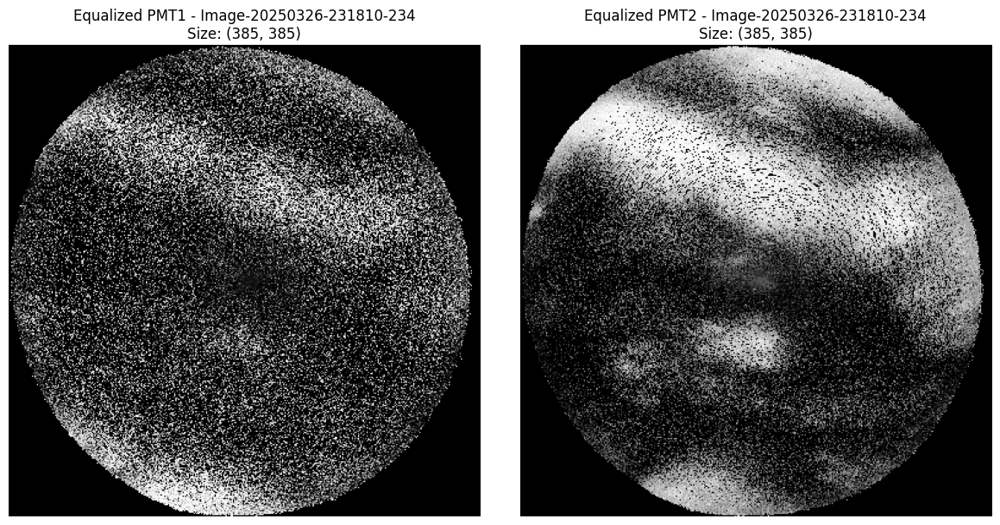

In [49]:
import random
import matplotlib.pyplot as plt
import numpy as np

# (Assuming the equalize_histogram() function is defined as follows:)
def equalize_histogram(image):
    """
    Perform histogram equalization on an image while keeping 0-intensity pixels (background) unchanged.
    
    Parameters:
        image (np.ndarray): Input image as a NumPy array.
        
    Returns:
        np.ndarray: Histogram-equalized image.
    """
    # Convert image to float64 for precision in computation
    eq_img = image.copy().astype(np.float64)
    # Create a mask for nonzero (signal) pixels
    mask = (eq_img > 0)
    if np.count_nonzero(mask) == 0:
        return eq_img

    # Extract nonzero pixel values
    pixels = eq_img[mask]
    
    # Compute histogram with 256 bins; you may adjust the bins as needed.
    hist, bins = np.histogram(pixels, bins=256, density=True)
    cdf = hist.cumsum()  # cumulative distribution function
    cdf_normalized = cdf / cdf[-1]  # Normalize to [0,1]
    
    # Map the original pixel values to equalized values via interpolation.
    eq_pixels = np.interp(pixels, bins[:-1], cdf_normalized * (bins[-1] - bins[0]) + bins[0])
    eq_img[mask] = eq_pixels
    # Return the equalized image (same shape, 0's remain 0)
    return eq_img

# Randomly select one scan from roi_image_pairs.
roi_choice = random.choice(list(roi_image_pairs.keys()))
scan_choice = random.choice(list(roi_image_pairs[roi_choice].keys()))
channels = roi_image_pairs[roi_choice][scan_choice]
print(f"Using scan: {scan_choice} in ROI: {roi_choice}")

# Load the PMT1 and PMT2 images from the selected scan.
metadata_PMT1, img_PMT1 = get_image_metadata(channels["PMT1"])
metadata_PMT2, img_PMT2 = get_image_metadata(channels["PMT2"])

# Apply histogram equalization on both images.
eq_img_PMT1 = equalize_histogram(img_PMT1)
eq_img_PMT2 = equalize_histogram(img_PMT2)

# Plot the equalized images side by side.
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(eq_img_PMT1, cmap="gray")
plt.title(f"Equalized PMT1 - {scan_choice}\nSize: {metadata_PMT1['Size (WxH)']}")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(eq_img_PMT2, cmap="gray")
plt.title(f"Equalized PMT2 - {scan_choice}\nSize: {metadata_PMT2['Size (WxH)']}")
plt.axis("off")

plt.tight_layout()
plt.show()


c) Pixel Transformation 
Since we need to perform mathematical transformations without any unnecessary truncations and loss of data, we convert the pixel representation  to float32. It ensures sufficient precision for image intensities, better performance on GPUs & smaller memory footprint for this large dataset.

In [50]:
import os
import numpy as np
import tifffile

# Define the input folder containing the equalized scans.
input_root = "/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/equalized_endoscopic_scans"
# Define the output folder where converted float32 files will be saved.
output_root = "/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/float32_endoscopic_scans"

# Create the umbrella output folder if it does not exist.
os.makedirs(output_root, exist_ok=True)

# Traverse through each ROI folder in the input_root.
for roi in os.listdir(input_root):
    roi_path = os.path.join(input_root, roi)
    if os.path.isdir(roi_path):
        # Create corresponding ROI folder in the output.
        output_roi_path = os.path.join(output_root, roi)
        os.makedirs(output_roi_path, exist_ok=True)
        
        # Traverse through each scan folder in this ROI.
        for scan in os.listdir(roi_path):
            scan_path = os.path.join(roi_path, scan)
            if os.path.isdir(scan_path):
                # Create corresponding scan folder in the output.
                output_scan_path = os.path.join(output_roi_path, scan)
                os.makedirs(output_scan_path, exist_ok=True)
                
                # Process each TIFF file (for each channel) in the scan folder.
                for file in os.listdir(scan_path):
                    if file.lower().endswith(('.tiff', '.tif')):
                        input_file = os.path.join(scan_path, file)
                        output_file = os.path.join(output_scan_path, file)
                        
                        # Read the image using tifffile.
                        image_array = tifffile.imread(input_file)
                        
                        # Convert the image array to float32.
                        image_float32 = image_array.astype(np.float32)
                        
                        # Save the converted image in the same folder structure.
                        tifffile.imwrite(output_file, image_float32)
                        print(f"Converted and saved {output_file} as float32")
                        
print("\nConversion complete. New folder structure in 'float32_endoscopic_scans':")
for roi in sorted(os.listdir(output_root)):
    print(f"ROI Folder: {roi}")
    roi_folder = os.path.join(output_root, roi)
    for scan in sorted(os.listdir(roi_folder)):
        print(f"  - {scan}")


Converted and saved /Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/float32_endoscopic_scans/ROI_1/Image-20250326-231210-592/PMT2.tiff as float32
Converted and saved /Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/float32_endoscopic_scans/ROI_1/Image-20250326-231210-592/PMT1.tiff as float32
Converted and saved /Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/float32_endoscopic_scans/ROI_1/Image-20250326-231205-592/PMT2.tiff as float32
Converted and saved /Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/float32_endoscopic_scans/ROI_1/Image-20250326-231205-592/PMT1.tiff as float32
Converted and saved /Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/float32_endoscopic_scans/ROI_1/Image-20250326-231208-917/PMT2.tiff as float32
Converted and saved /Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/float32_endoscopic_scans/ROI_1/Image-20250326-231208-917/PMT1.tiff as float32
Converted and saved /Users/alliyaparvez/Documents/canc_img_denoi

d) Normalization 

Normalized and saved: /Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/normalized_float32_endoscopic_scans/ROI_1/Image-20250326-231210-592/PMT2.tiff
Normalized and saved: /Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/normalized_float32_endoscopic_scans/ROI_1/Image-20250326-231210-592/PMT1.tiff
Normalized and saved: /Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/normalized_float32_endoscopic_scans/ROI_1/Image-20250326-231205-592/PMT2.tiff
Normalized and saved: /Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/normalized_float32_endoscopic_scans/ROI_1/Image-20250326-231205-592/PMT1.tiff
Normalized and saved: /Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/normalized_float32_endoscopic_scans/ROI_1/Image-20250326-231208-917/PMT2.tiff
Normalized and saved: /Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/normalized_float32_endoscopic_scans/ROI_1/Image-20250326-231208-917/PMT1.tiff
Normalized and saved: /Users/alliyaparvez/Documents/

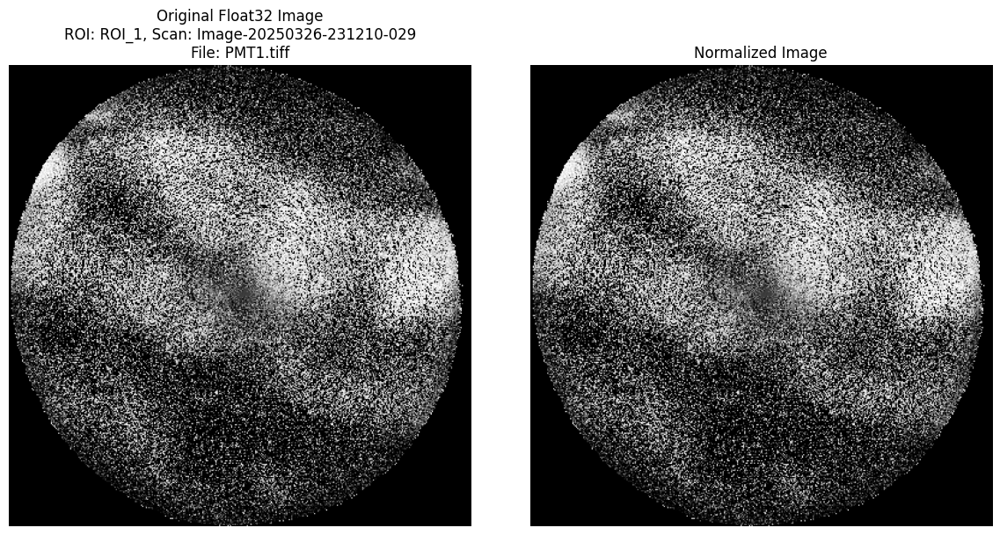

In [ ]:
import os
import numpy as np
import tifffile
import random
import matplotlib.pyplot as plt

# Define input folder (where the float32 images are stored) and the output folder.
dataset_root = "/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset"
input_root = os.path.join(dataset_root, "float32_endoscopic_scans")
output_root = os.path.join(dataset_root, "normalized_float32_endoscopic_scans")
os.makedirs(output_root, exist_ok=True)

# Traverse through the folder structure in input_root and create the output structure.
for roi in os.listdir(input_root):
    roi_path = os.path.join(input_root, roi)
    if os.path.isdir(roi_path):
        # Create corresponding ROI folder in the output
        output_roi_path = os.path.join(output_root, roi)
        os.makedirs(output_roi_path, exist_ok=True)
        
        # Traverse through each scan folder within the ROI
        for scan in os.listdir(roi_path):
            scan_path = os.path.join(roi_path, scan)
            if os.path.isdir(scan_path):
                # Create corresponding scan folder in the output
                output_scan_path = os.path.join(output_roi_path, scan)
                os.makedirs(output_scan_path, exist_ok=True)
                
                # Process each TIFF file in the scan folder
                for filename in os.listdir(scan_path):
                    if filename.lower().endswith(('.tif', '.tiff')):
                        input_file = os.path.join(scan_path, filename)
                        output_file = os.path.join(output_scan_path, filename)
                        
                        # Read the image using tifffile.
                        img = tifffile.imread(input_file)
                        
                        # Perform min–max normalization on the float32 image
                        img_min = img.min()
                        img_max = img.max()
                        norm_img = (img - img_min) / (img_max - img_min + 1e-6)
                        
                        # Ensure the normalized image is float32.
                        norm_img = norm_img.astype(np.float32)
                        
                        # Save the normalized image using tifffile.
                        tifffile.imwrite(output_file, norm_img)
                        print(f"Normalized and saved: {output_file}")

# List the new folder structure.
print("\nNormalized float32 endoscopic scans have been saved with the following folder structure:")
for roi_name in sorted(os.listdir(output_root)):
    roi_folder = os.path.join(output_root, roi_name)
    if os.path.isdir(roi_folder):
        print(f"ROI Folder: {roi_name}")
        for scan_folder in sorted(os.listdir(roi_folder)):
            print(f"  - {scan_folder}")

# Select a random ROI folder from the input folder.
roi_list = [roi for roi in os.listdir(input_root) if os.path.isdir(os.path.join(input_root, roi))]
selected_roi = random.choice(roi_list)
roi_input_path = os.path.join(input_root, selected_roi)
roi_output_path = os.path.join(output_root, selected_roi)

# Select a random scan folder from the selected ROI.
scan_list = [scan for scan in os.listdir(roi_input_path) if os.path.isdir(os.path.join(roi_input_path, scan))]
selected_scan = random.choice(scan_list)
scan_input_path = os.path.join(roi_input_path, selected_scan)
scan_output_path = os.path.join(roi_output_path, selected_scan)

# Get list of TIFF files in the selected scan folder.
tiff_files = [f for f in os.listdir(scan_input_path) if f.lower().endswith(('.tif', '.tiff'))]
selected_file = random.choice(tiff_files)

# Build full paths for the original (float32) image and the normalized image.
input_image_path = os.path.join(scan_input_path, selected_file)
normalized_image_path = os.path.join(scan_output_path, selected_file)

# Load images using tifffile.imread()
orig_img = tifffile.imread(input_image_path)
norm_img = tifffile.imread(normalized_image_path)

# Plot the images side by side.
plt.figure(figsize=(12, 6))

plt.subplot(1,2,1)
plt.imshow(orig_img, cmap='gray')
plt.title(f"Original Float32 Image\nROI: {selected_roi}, Scan: {selected_scan}\nFile: {selected_file}")
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(norm_img, cmap='gray')
plt.title("Normalized Image")
plt.axis('off')

plt.tight_layout()
plt.show()

Step#4: Construction of Ground Truth 

Saved ground truth image for ROI ROI_1, PMT1 at: /Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/ground_truth_normalized_endoscopic_scans/ROI_1/ROI_1_PMT1_ground_truth.tiff


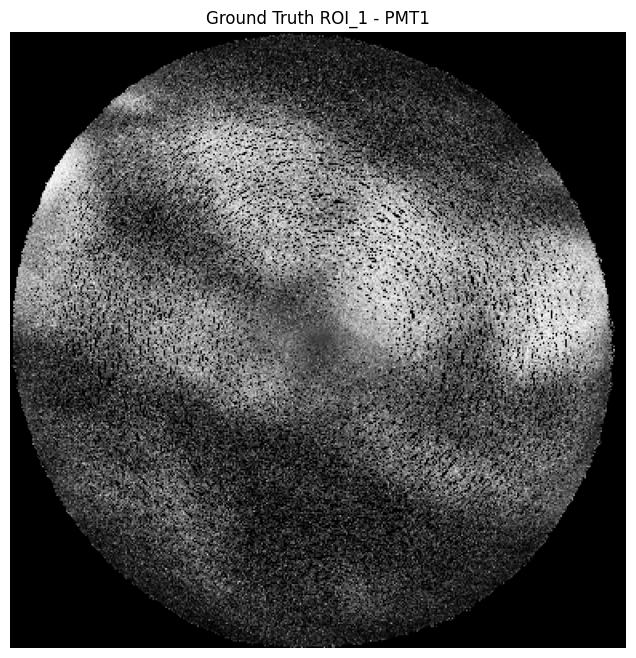

Saved ground truth image for ROI ROI_1, PMT2 at: /Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/ground_truth_normalized_endoscopic_scans/ROI_1/ROI_1_PMT2_ground_truth.tiff


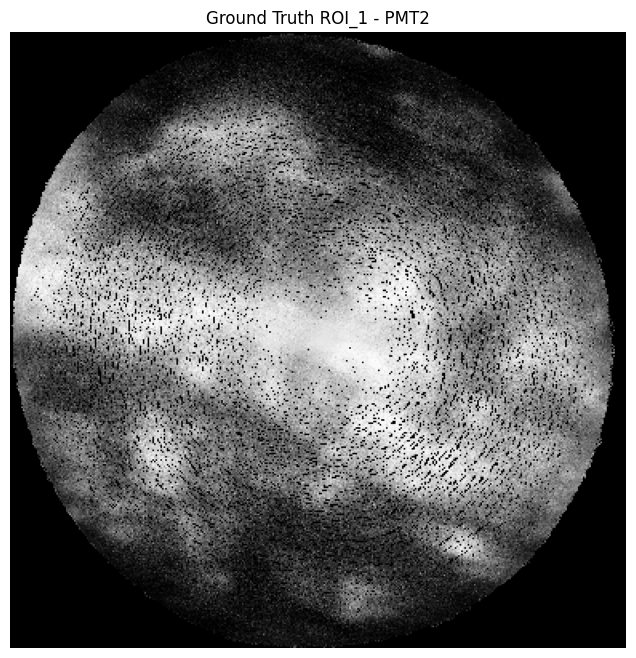

Saved ground truth image for ROI ROI_2, PMT1 at: /Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/ground_truth_normalized_endoscopic_scans/ROI_2/ROI_2_PMT1_ground_truth.tiff


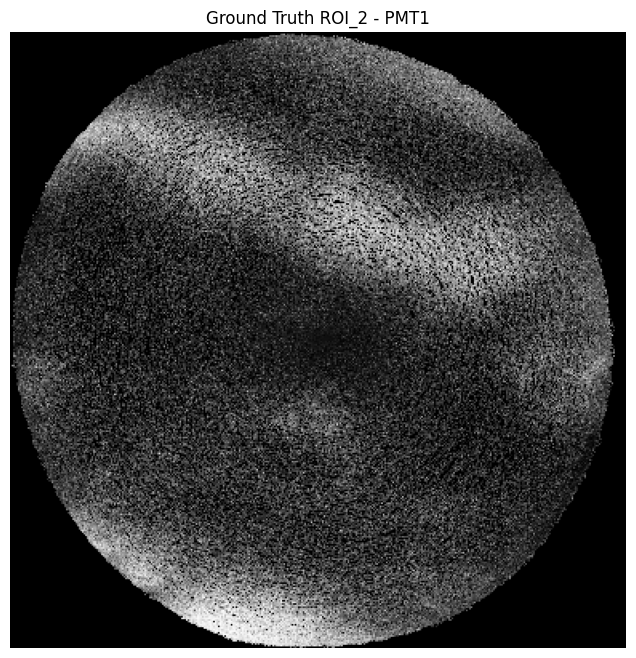

Saved ground truth image for ROI ROI_2, PMT2 at: /Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/ground_truth_normalized_endoscopic_scans/ROI_2/ROI_2_PMT2_ground_truth.tiff


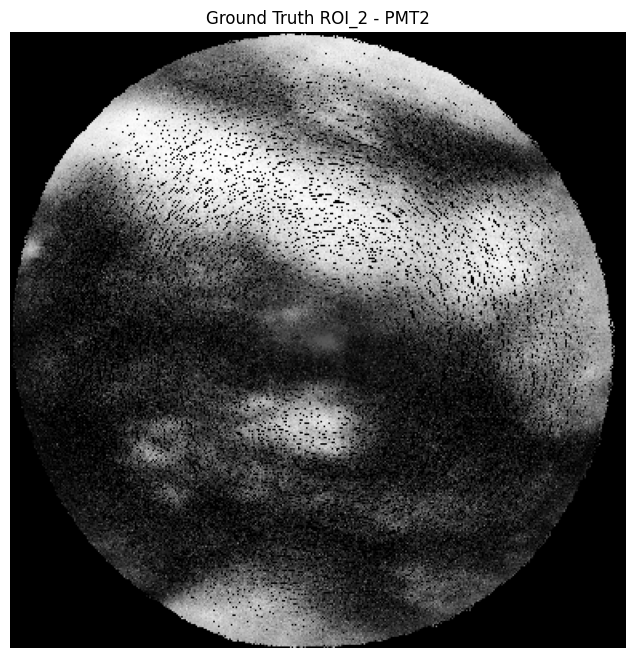

Saved ground truth image for ROI ROI_3, PMT1 at: /Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/ground_truth_normalized_endoscopic_scans/ROI_3/ROI_3_PMT1_ground_truth.tiff


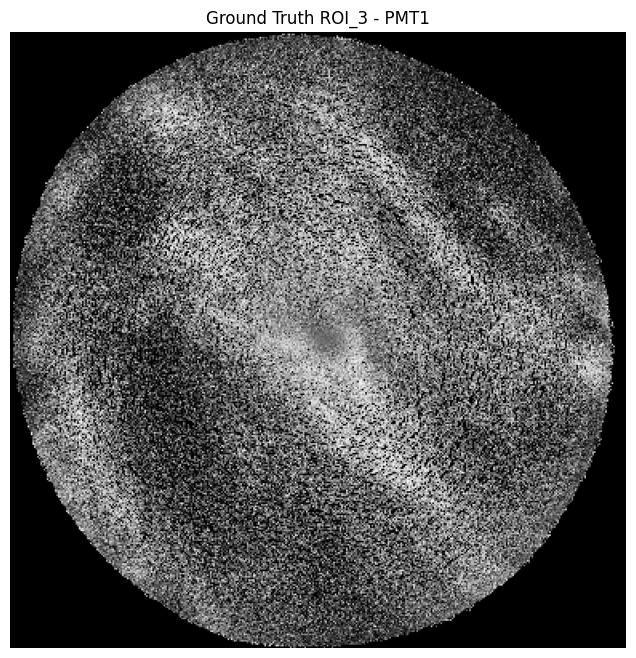

Saved ground truth image for ROI ROI_3, PMT2 at: /Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/ground_truth_normalized_endoscopic_scans/ROI_3/ROI_3_PMT2_ground_truth.tiff


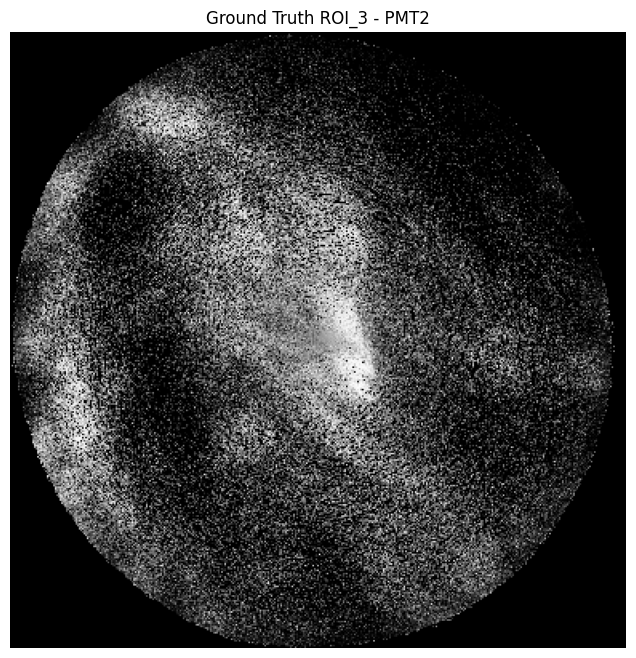

In [52]:
import os
import numpy as np
import tifffile
import matplotlib.pyplot as plt

# Define dataset root and input/output folders.
dataset_root = "/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset"
normalized_input = os.path.join(dataset_root, "normalized_float32_endoscopic_scans")
output_root = os.path.join(dataset_root, "ground_truth_normalized_endoscopic_scans")
os.makedirs(output_root, exist_ok=True)

# Iterate over each ROI folder inside normalized_input.
for roi in sorted(os.listdir(normalized_input)):
    roi_input_path = os.path.join(normalized_input, roi)
    if not os.path.isdir(roi_input_path):
        continue

    # Create a corresponding ROI folder in the output folder.
    roi_output_path = os.path.join(output_root, roi)
    os.makedirs(roi_output_path, exist_ok=True)
    
    # Process each channel in this ROI.
    for channel in ["PMT1", "PMT2"]:
        image_list = []
        # Get the list of scan folders within this ROI.
        scan_list = sorted([scan for scan in os.listdir(roi_input_path) if os.path.isdir(os.path.join(roi_input_path, scan))])
        # Select up to the first 10 scans.
        selected_scans = scan_list[:10] if len(scan_list) >= 10 else scan_list
        
        for scan in selected_scans:
            scan_input_path = os.path.join(roi_input_path, scan)
            # Construct expected filename for the current channel.
            file_name = f"{channel}.tiff"
            file_path = os.path.join(scan_input_path, file_name)
            if os.path.exists(file_path):
                # Load the normalized image (which is already float32 and in the [0,1] range).
                img = tifffile.imread(file_path)
                image_list.append(img)
            else:
                print(f"File not found: {file_path}")
        
        if len(image_list) == 0:
            print(f"No images found for ROI {roi}, channel {channel}.")
            continue
        
        # Stack the images and compute the mean to create the high resolution ground truth image.
        stacked_images = np.stack(image_list, axis=0)
        averaged_img = np.mean(stacked_images, axis=0)
        
        # Save the averaged (ground truth) image.
        out_file_name = f"{roi}_{channel}_ground_truth.tiff"
        out_path = os.path.join(roi_output_path, out_file_name)
        tifffile.imwrite(out_path, averaged_img.astype(np.float32))
        print(f"Saved ground truth image for ROI {roi}, {channel} at: {out_path}")
        
        # Optionally display the averaged image.
        plt.figure(figsize=(8, 8))
        plt.imshow(averaged_img, cmap="gray")
        plt.title(f"Ground Truth {roi} - {channel}")
        plt.axis("off")
        plt.show()


In [53]:
pip install opencv-python

Note: you may need to restart the kernel to use updated packages.


Saved:
 /Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/superres_ground_truth_endoscopic_scans/ROI_1/ROI_1_PMT1_averaged.tiff
 /Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/superres_ground_truth_endoscopic_scans/ROI_1/ROI_1_PMT1_interpolated.tiff
 /Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/superres_ground_truth_endoscopic_scans/ROI_1/ROI_1_PMT1_multiframe.tiff


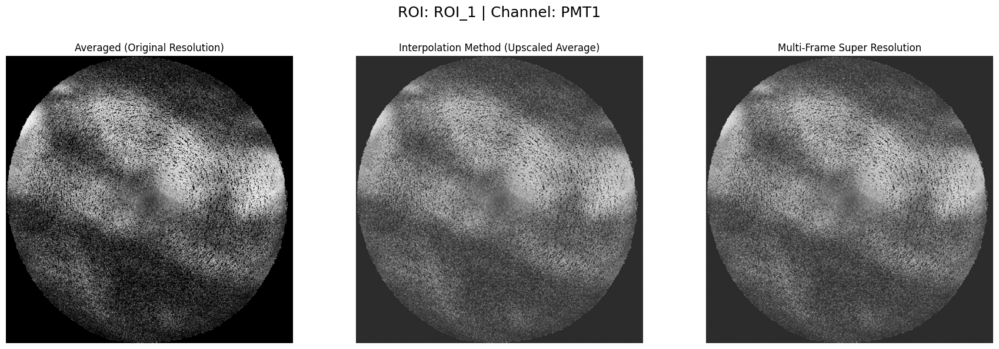

Saved:
 /Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/superres_ground_truth_endoscopic_scans/ROI_1/ROI_1_PMT2_averaged.tiff
 /Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/superres_ground_truth_endoscopic_scans/ROI_1/ROI_1_PMT2_interpolated.tiff
 /Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/superres_ground_truth_endoscopic_scans/ROI_1/ROI_1_PMT2_multiframe.tiff


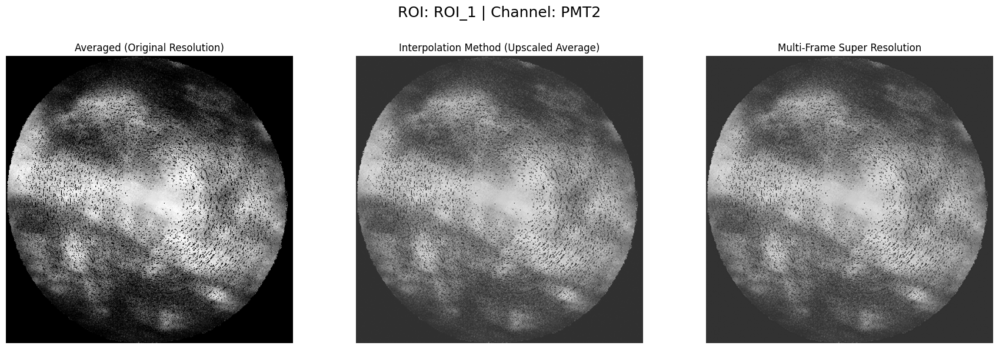

Saved:
 /Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/superres_ground_truth_endoscopic_scans/ROI_2/ROI_2_PMT1_averaged.tiff
 /Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/superres_ground_truth_endoscopic_scans/ROI_2/ROI_2_PMT1_interpolated.tiff
 /Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/superres_ground_truth_endoscopic_scans/ROI_2/ROI_2_PMT1_multiframe.tiff


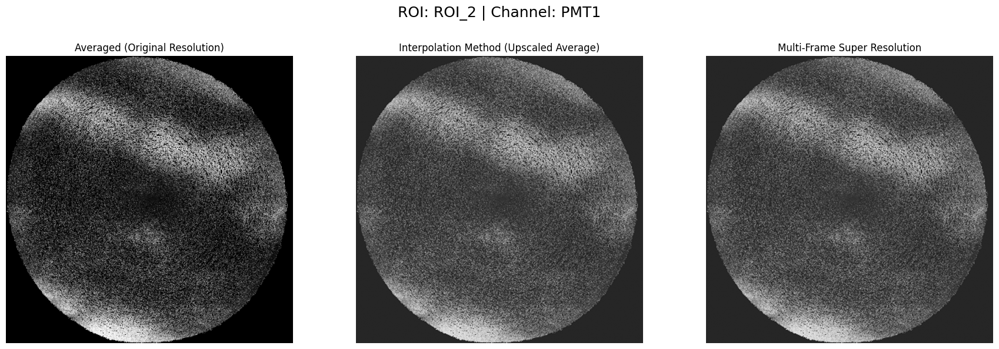

Saved:
 /Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/superres_ground_truth_endoscopic_scans/ROI_2/ROI_2_PMT2_averaged.tiff
 /Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/superres_ground_truth_endoscopic_scans/ROI_2/ROI_2_PMT2_interpolated.tiff
 /Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/superres_ground_truth_endoscopic_scans/ROI_2/ROI_2_PMT2_multiframe.tiff


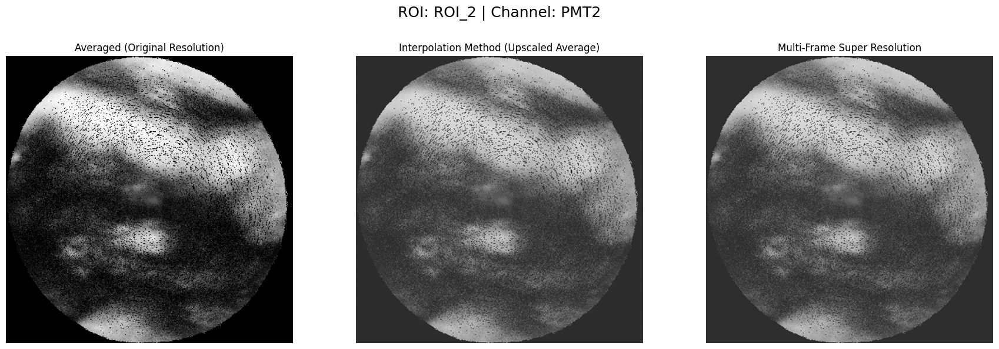

Saved:
 /Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/superres_ground_truth_endoscopic_scans/ROI_3/ROI_3_PMT1_averaged.tiff
 /Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/superres_ground_truth_endoscopic_scans/ROI_3/ROI_3_PMT1_interpolated.tiff
 /Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/superres_ground_truth_endoscopic_scans/ROI_3/ROI_3_PMT1_multiframe.tiff


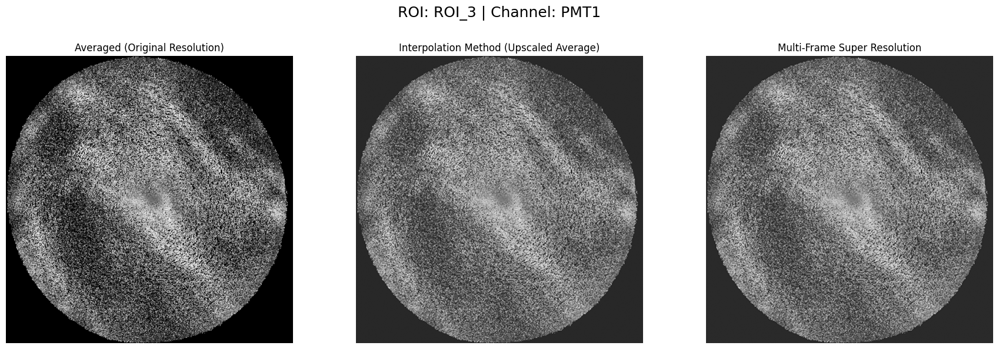

Saved:
 /Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/superres_ground_truth_endoscopic_scans/ROI_3/ROI_3_PMT2_averaged.tiff
 /Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/superres_ground_truth_endoscopic_scans/ROI_3/ROI_3_PMT2_interpolated.tiff
 /Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/superres_ground_truth_endoscopic_scans/ROI_3/ROI_3_PMT2_multiframe.tiff


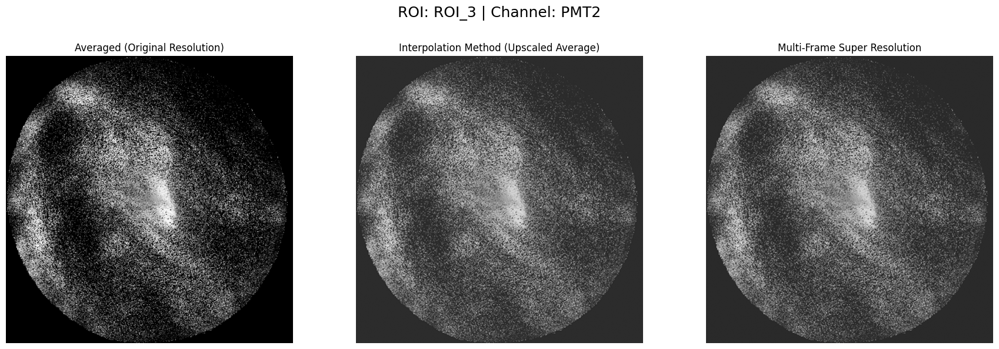

In [ ]:
import os
import numpy as np
import tifffile
import cv2
import matplotlib.pyplot as plt

def average_method(image_list):
    """
    Averages a list of images (pixel-wise) at the original resolution.
    """
    stacked = np.stack(image_list, axis=0)
    return np.mean(stacked, axis=0)

def interpolation_method(image_list, scale=2):
    """
    Upscales each image by the specified scale using bicubic interpolation and averages them.
    """
    upscaled_images = []
    for img in image_list:
        # Resize image using OpenCV bicubic interpolation.
        up = cv2.resize(img, None, fx=scale, fy=scale, interpolation=cv2.INTER_CUBIC)
        upscaled_images.append(up)
    stacked = np.stack(upscaled_images, axis=0)
    return np.mean(stacked, axis=0)

def multi_frame_superres_method(image_list, scale=2):
    """
    A simplified multi-frame super resolution method:
      - Upscale each image by the given scale factor.
      - Use the first image as a base (hr_base).
      - For each subsequent image, estimate the subpixel shift using phase correlation,
        warp the image accordingly, and then accumulate.
      - Average the aligned high-resolution images.
    """
    # Upscale the first image as the base.
    hr_base = cv2.resize(image_list[0], None, fx=scale, fy=scale, interpolation=cv2.INTER_CUBIC)
    sum_img = hr_base.copy()
    count = 1
    for img in image_list[1:]:
        hr_img = cv2.resize(img, None, fx=scale, fy=scale, interpolation=cv2.INTER_CUBIC)
        shift, response = cv2.phaseCorrelate(hr_base, hr_img)
        M = np.float32([[1, 0, shift[0]], [0, 1, shift[1]]])
        aligned = cv2.warpAffine(hr_img, M, (hr_img.shape[1], hr_img.shape[0]), flags=cv2.INTER_CUBIC)
        sum_img += aligned
        count += 1
    return sum_img / count

# Parameters and Folder Setup

dataset_root = "/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset"
normalized_folder = os.path.join(dataset_root, "normalized_float32_endoscopic_scans")
output_superres = os.path.join(dataset_root, "superres_ground_truth_endoscopic_scans")
os.makedirs(output_superres, exist_ok=True)

# Get list of ROI folders from the normalized folder.
roi_list = sorted([roi for roi in os.listdir(normalized_folder) if os.path.isdir(os.path.join(normalized_folder, roi))])

# Process Each ROI and Channel, Save Results, and Display Comparison

for roi in roi_list:
    roi_path = os.path.join(normalized_folder, roi)
    # Create corresponding ROI folder in the output.
    output_roi = os.path.join(output_superres, roi)
    os.makedirs(output_roi, exist_ok=True)
    
    # Get list of scan folders in this ROI.
    scan_list = sorted([scan for scan in os.listdir(roi_path) if os.path.isdir(os.path.join(roi_path, scan))])
    if len(scan_list) == 0:
        continue
    
    for channel in ["PMT1", "PMT2"]:
        image_list = []
        # Select up to 10 scans.
        selected_scans = scan_list[:10] if len(scan_list) >= 10 else scan_list
        
        for scan in selected_scans:
            scan_path = os.path.join(roi_path, scan)
            file_name = f"{channel}.tiff"
            file_path = os.path.join(scan_path, file_name)
            if os.path.exists(file_path):
                img = tifffile.imread(file_path)
                # Our normalized images are already float32 in the [0,1] range.
                image_list.append(img)
            else:
                print(f"File not found: {file_path}")
        
        if len(image_list) == 0:
            print(f"No images found for ROI {roi} channel {channel}")
            continue
        
        # Compute high-resolution images using the three methods.
        method1 = average_method(image_list)
        method2 = interpolation_method(image_list, scale=2)
        method3 = multi_frame_superres_method(image_list, scale=2)
        
        # Save the results in the ROI output folder with descriptive filenames.
        out_file1 = os.path.join(output_roi, f"{roi}_{channel}_averaged.tiff")
        out_file2 = os.path.join(output_roi, f"{roi}_{channel}_interpolated.tiff")
        out_file3 = os.path.join(output_roi, f"{roi}_{channel}_multiframe.tiff")
        tifffile.imwrite(out_file1, method1.astype(np.float32))
        tifffile.imwrite(out_file2, method2.astype(np.float32))
        tifffile.imwrite(out_file3, method3.astype(np.float32))
        print(f"Saved:\n {out_file1}\n {out_file2}\n {out_file3}")
        
        # Visualization: Display results side by side for comparison.

        plt.figure(figsize=(18, 6))
        plt.suptitle(f"ROI: {roi} | Channel: {channel}", fontsize=18)
        
        plt.subplot(1, 3, 1)
        plt.imshow(method1, cmap='gray')
        plt.title("Averaged (Original Resolution)")
        plt.axis("off")
        
        plt.subplot(1, 3, 2)
        plt.imshow(method2, cmap='gray')
        plt.title("Interpolation Method (Upscaled Average)")
        plt.axis("off")
        
        plt.subplot(1, 3, 3)
        plt.imshow(method3, cmap='gray')
        plt.title("Multi-Frame Super Resolution")
        plt.axis("off")
        
        plt.tight_layout(rect=[0, 0, 1, 0.93])
        plt.show()


Step#5: Preliminary Denosoising Model 

a) Convolutional Autoencoder

In [72]:
import sys

print("Python version:", sys.version)
print("Python version info:", sys.version_info)


Python version: 3.13.3 (v3.13.3:6280bb54784, Apr  8 2025, 10:47:54) [Clang 15.0.0 (clang-1500.3.9.4)]
Python version info: sys.version_info(major=3, minor=13, micro=3, releaselevel='final', serial=0)


In [73]:
import sys
import subprocess

# Print the current Python version and version info.
print("Python version:", sys.version)
print("Python version info:", sys.version_info)

# TensorFlow's official releases are generally supported for Python 3.7 up to 3.10.
if sys.version_info < (3, 7) or sys.version_info >= (3, 11):
    print("WARNING: Your Python version may not be supported by the official TensorFlow package.")
    print("Please consider installing a supported version (e.g., Python 3.7 - 3.10),")
    print("or, if on macOS with Apple Silicon, try 'tensorflow-macos' or 'tensorflow-cpu'.")
else:
    print("Your Python version is supported. Proceeding with installation of TensorFlow...")
    
    # Upgrade pip, setuptools, and wheel to ensure compatibility.
    subprocess.check_call([sys.executable, "-m", "pip", "install", "--upgrade", "pip", "setuptools", "wheel"])
    
    # Install the official TensorFlow package.
    subprocess.check_call([sys.executable, "-m", "pip", "install", "tensorflow"])
    
    # Optionally, verify the installation by importing TensorFlow and printing its version.
    import tensorflow as tf
    print("TensorFlow version:", tf.__version__)


Python version: 3.13.3 (v3.13.3:6280bb54784, Apr  8 2025, 10:47:54) [Clang 15.0.0 (clang-1500.3.9.4)]
Python version info: sys.version_info(major=3, minor=13, micro=3, releaselevel='final', serial=0)
Please consider installing a supported version (e.g., Python 3.7 - 3.10),
or, if on macOS with Apple Silicon, try 'tensorflow-macos' or 'tensorflow-cpu'.


In [74]:
%pip install torch torchvision tifffile scikit-image matplotlib


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.5/66.5 MB 59.3 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.2/6.2 MB 63.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 64.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 536.2/536.2 kB 30.1 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [84]:
import os
from PIL import Image

def check_image_sizes(folder_path):
    sizes = {}
    mismatched_files = []

    for filename in os.listdir(folder_path):
        if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.tiff', '.bmp')):
            filepath = os.path.join(folder_path, filename)
            with Image.open(filepath) as img:
                size = img.size  # (width, height)
                if not sizes:
                    common_size = size
                elif size != common_size:
                    mismatched_files.append(filename)

    if not mismatched_files:
        print(f"✅ All images are the same size: {common_size}")
    else:
        print("⚠️ These images have different sizes:")
        for fname in mismatched_files:
            print(f"- {fname}")

# Example usage
check_image_sizes("/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/raw_endoscopic_scans")


✅ All images are the same size: (385, 385)


ROI#1, PMT1

Found 10 scans in ROI_1 for channel PMT1
Number of noisy input samples: 10
Common shape: (384, 384)
Training samples: 8 Test samples: 2
SimpleAutoencoder(
  (encoder): Sequential(
    (0): Conv2d(1, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (decoder): Sequential(
    (0): Upsample(scale_factor=2.0, mode='nearest')
    (1): Conv2d(16, 1, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (2): Sigmoid()
  )
)
Epoch [1/30] Training Loss: 0.114775 Val Loss: 0.111944
Epoch [2/30] Training Loss: 0.111017 Val Loss: 0.108362
Epoch [3/30] Training Loss: 0.107498 Val Loss: 0.105030
Epoch [4/30] Training Loss: 0.104234 Val Loss: 0.101960
Epoch [5/30] Training Loss: 0.101230 Val Loss: 0.099151
Epoch [6/30] Training Loss: 0.098484 Val Loss: 0.096594
Epoch [7/30] Training Loss: 0.095985 Val Loss: 0.094269
Epoch [8/30] Training Loss: 0.093713 Val Loss: 0.092143
Epoch 

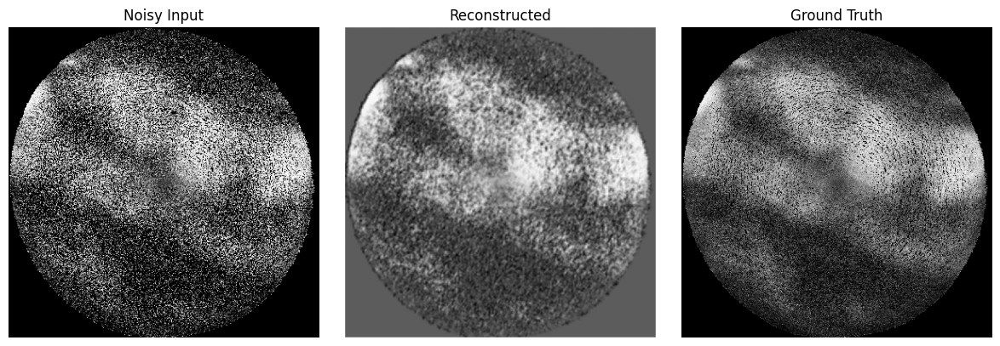

In [ ]:
import os
import numpy as np
import tifffile
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as compute_ssim
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
from math import log10

# Utility: Center crop to common dimensions (if needed)

def center_crop(img, new_h, new_w):
    h, w = img.shape[:2]
    start_h = (h - new_h) // 2
    start_w = (w - new_w) // 2
    if img.ndim == 3:
        return img[start_h:start_h+new_h, start_w:start_w+new_w, :]
    else:
        return img[start_h:start_h+new_h, start_w:start_w+new_w]


# Paths and Parameters

dataset_root = "/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset"
roi = "ROI_1"
channel = "PMT1"

# Ground truth averaged image
gt_path = os.path.join(dataset_root, "ground_truth_normalized_endoscopic_scans", roi, f"{roi}_{channel}_ground_truth.tiff")
gt_image = tifffile.imread(gt_path)  # shape: (H, W)
gt_image = gt_image.astype(np.float32)
gt_image = np.expand_dims(gt_image, axis=-1)  # shape: (H, W, 1)

# Folder containing normalized (noisy) images
noisy_folder = os.path.join(dataset_root, "normalized_float32_endoscopic_scans", roi)
scan_list = [d for d in os.listdir(noisy_folder) if os.path.isdir(os.path.join(noisy_folder, d))]
print(f"Found {len(scan_list)} scans in {roi} for channel {channel}")


# Build Input Dataset: Load noisy images and repeat ground truth as target

input_images = []
for scan in scan_list:
    scan_path = os.path.join(noisy_folder, scan)
    file_path = os.path.join(scan_path, f"{channel}.tiff")
    if os.path.exists(file_path):
        img = tifffile.imread(file_path)  # expected normalized [0,1], shape: (H, W)
        img = img.astype(np.float32)
        img = np.expand_dims(img, axis=-1)
        input_images.append(img)
    else:
        print(f"File not found: {file_path}")

input_images = np.array(input_images)  # shape: (N, H, W, 1)
num_samples = input_images.shape[0]
print("Number of noisy input samples:", num_samples)

# Determine common height and width from the noisy images (assuming at least one exists)
common_h = min(img.shape[0] for img in input_images)
common_w = min(img.shape[1] for img in input_images)
common_h = common_h - (common_h % 2)  # Ensure even dimensions for pooling layers
common_w = common_w - (common_w % 2)  # Ensure even dimensions for pooling layers
print(f"Common shape: ({common_h}, {common_w})")

# Crop all noisy images and ground truth to the common shape.
input_images = np.array([center_crop(img, common_h, common_w) for img in input_images])
gt_image = center_crop(gt_image, common_h, common_w)

# Create target dataset by repeating the ground truth for each input.
target_images = np.repeat(np.expand_dims(gt_image, axis=0), num_samples, axis=0)

# Convert to PyTorch tensors and rearrange to (N, C, H, W)
X = torch.from_numpy(np.transpose(input_images, (0, 3, 1, 2)))  # shape: (N, 1, H, W)
Y = torch.from_numpy(np.transpose(target_images, (0, 3, 1, 2)))  # shape: (N, 1, H, W)

# Split data (80/20)
split_idx = int(0.8 * num_samples)
X_train, Y_train = X[:split_idx], Y[:split_idx]
X_test, Y_test = X[split_idx:], Y[split_idx:]
print("Training samples:", X_train.shape[0], "Test samples:", X_test.shape[0])

# Create DataLoaders.
batch_size = 4
train_dataset = TensorDataset(X_train, Y_train)
test_dataset  = TensorDataset(X_test, Y_test)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader  = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)


# Define a Simpler Autoencoder in PyTorch

class SimpleAutoencoder(nn.Module):
    def __init__(self):
        super(SimpleAutoencoder, self).__init__()
        # Encoder: one convolution followed by pooling.
        self.encoder = nn.Sequential(
            nn.Conv2d(1, 16, kernel_size=3, padding=1),  # (N, 16, H, W)
            nn.ReLU(True),
            nn.MaxPool2d(2, stride=2)                   # (N, 16, H/2, W/2)
        )
        # Decoder: one upsampling layer and one convolution.
        self.decoder = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='nearest'),  # (N, 16, H, W)
            nn.Conv2d(16, 1, kernel_size=3, padding=1),     # (N, 1, H, W)
            nn.Sigmoid()                                   # Output in [0,1]
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = SimpleAutoencoder().to(device)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)
print(model)


# Train the Autoencoder

num_epochs = 30  # Fewer epochs for a simpler model
train_losses = []
val_losses = []

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for inputs, targets in train_loader:
        inputs = inputs.to(device)
        targets = targets.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)
    epoch_loss = running_loss / len(train_loader.dataset)
    train_losses.append(epoch_loss)
    
    model.eval()
    val_running_loss = 0.0
    with torch.no_grad():
        for inputs, targets in test_loader:
            inputs = inputs.to(device)
            targets = targets.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            val_running_loss += loss.item() * inputs.size(0)
    val_loss = val_running_loss / len(test_loader.dataset)
    val_losses.append(val_loss)
    print(f"Epoch [{epoch+1}/{num_epochs}] Training Loss: {epoch_loss:.6f} Val Loss: {val_loss:.6f}")


# Evaluate the Autoencoder on Test Set

model.eval()
reconstructed = []
with torch.no_grad():
    for inputs, _ in test_loader:
        inputs = inputs.to(device)
        outputs = model(inputs)
        reconstructed.append(outputs.cpu().numpy())
reconstructed = np.concatenate(reconstructed, axis=0)

# Compute performance metrics on test set.
mse_list = []
psnr_list = []
ssim_list = []
Y_test_np = Y_test.cpu().numpy()

for i in range(X_test.shape[0]):
    gt = Y_test_np[i].squeeze()  # (H,W)
    recon = reconstructed[i].squeeze()
    mse_val = np.mean((gt - recon) ** 2)
    mse_list.append(mse_val)
    psnr_val = 10 * log10(1.0 / mse_val) if mse_val > 0 else 100
    psnr_list.append(psnr_val)
    ssim_val = compute_ssim(gt, recon, data_range=1.0)
    ssim_list.append(ssim_val)

mean_mse = np.mean(mse_list)
mean_psnr = np.mean(psnr_list)
mean_ssim = np.mean(ssim_list)

print(f"Test MSE: {mean_mse:.6f}")
print(f"Test PSNR: {mean_psnr:.2f} dB")
print(f"Test SSIM: {mean_ssim:.4f}")


# Display a Sample Test Comparison

sample_idx = 0
plt.figure(figsize=(12,4))

plt.subplot(1,3,1)
plt.imshow(X_test[sample_idx].cpu().squeeze(), cmap='gray')
plt.title("Noisy Input")
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(reconstructed[sample_idx].squeeze(), cmap='gray')
plt.title("Reconstructed")
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(Y_test[sample_idx].cpu().squeeze(), cmap='gray')
plt.title("Ground Truth")
plt.axis('off')

plt.tight_layout()
plt.show()


b) U-Net 

Found 10 scans in ROI_1 for channel PMT1
Number of noisy input samples: 10
Common shape: (384, 384)
Training samples: 8 Test samples: 2
UNet(
  (encoder1): Sequential(
    (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
  )
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (encoder2): Sequential(
    (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (4): BatchNorm

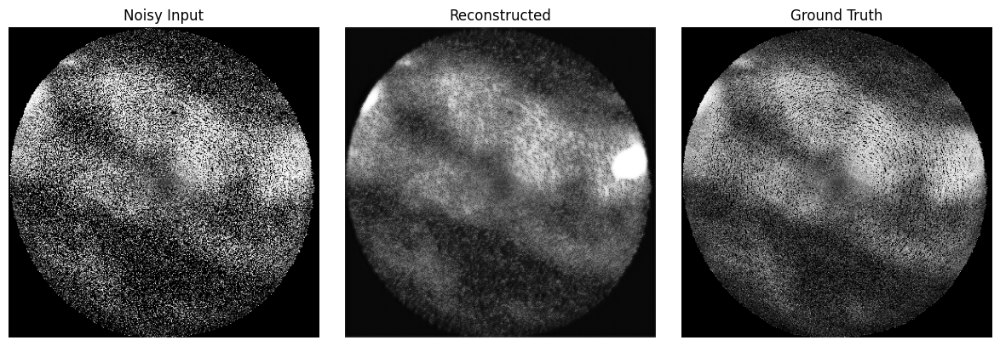

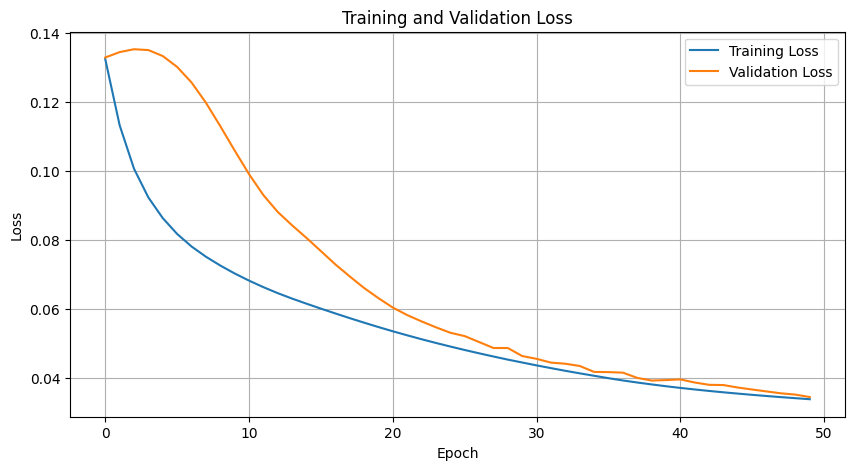

In [86]:
import os
import numpy as np
import tifffile
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as compute_ssim
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
from math import log10

# Utility: Center crop to common dimensions (if needed)
def center_crop(img, new_h, new_w):
    h, w = img.shape[:2]
    start_h = (h - new_h) // 2
    start_w = (w - new_w) // 2
    if img.ndim == 3:
        return img[start_h:start_h+new_h, start_w:start_w+new_w, :]
    else:
        return img[start_h:start_h+new_h, start_w:start_w+new_w]

# U-Net Model Definition
class UNet(nn.Module):
    def __init__(self, in_channels=1, out_channels=1, init_features=32):
        super(UNet, self).__init__()
        
        features = init_features
        self.encoder1 = UNet._block(in_channels, features, name="enc1")
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.encoder2 = UNet._block(features, features * 2, name="enc2")
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.encoder3 = UNet._block(features * 2, features * 4, name="enc3")
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.encoder4 = UNet._block(features * 4, features * 8, name="enc4")
        self.pool4 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.bottleneck = UNet._block(features * 8, features * 16, name="bottleneck")

        self.upconv4 = nn.ConvTranspose2d(features * 16, features * 8, kernel_size=2, stride=2)
        self.decoder4 = UNet._block((features * 8) * 2, features * 8, name="dec4")
        self.upconv3 = nn.ConvTranspose2d(features * 8, features * 4, kernel_size=2, stride=2)
        self.decoder3 = UNet._block((features * 4) * 2, features * 4, name="dec3")
        self.upconv2 = nn.ConvTranspose2d(features * 4, features * 2, kernel_size=2, stride=2)
        self.decoder2 = UNet._block((features * 2) * 2, features * 2, name="dec2")
        self.upconv1 = nn.ConvTranspose2d(features * 2, features, kernel_size=2, stride=2)
        self.decoder1 = UNet._block(features * 2, features, name="dec1")

        self.conv = nn.Conv2d(in_channels=features, out_channels=out_channels, kernel_size=1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        # Encoder
        enc1 = self.encoder1(x)
        enc2 = self.encoder2(self.pool1(enc1))
        enc3 = self.encoder3(self.pool2(enc2))
        enc4 = self.encoder4(self.pool3(enc3))
        
        # Bottleneck
        bottleneck = self.bottleneck(self.pool4(enc4))
        
        # Decoder with skip connections
        dec4 = self.upconv4(bottleneck)
        dec4 = torch.cat((dec4, enc4), dim=1)
        dec4 = self.decoder4(dec4)
        
        dec3 = self.upconv3(dec4)
        dec3 = torch.cat((dec3, enc3), dim=1)
        dec3 = self.decoder3(dec3)
        
        dec2 = self.upconv2(dec3)
        dec2 = torch.cat((dec2, enc2), dim=1)
        dec2 = self.decoder2(dec2)
        
        dec1 = self.upconv1(dec2)
        dec1 = torch.cat((dec1, enc1), dim=1)
        dec1 = self.decoder1(dec1)
        
        return self.sigmoid(self.conv(dec1))

    @staticmethod
    def _block(in_channels, features, name):
        return nn.Sequential(
            nn.Conv2d(
                in_channels=in_channels,
                out_channels=features,
                kernel_size=3,
                padding=1,
                bias=False,
            ),
            nn.BatchNorm2d(num_features=features),
            nn.ReLU(inplace=True),
            nn.Conv2d(
                in_channels=features,
                out_channels=features,
                kernel_size=3,
                padding=1,
                bias=False,
            ),
            nn.BatchNorm2d(num_features=features),
            nn.ReLU(inplace=True),
        )

# Paths and Parameters
dataset_root = "/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset"
roi = "ROI_1"
channel = "PMT1"

# Ground truth averaged image
gt_path = os.path.join(dataset_root, "ground_truth_normalized_endoscopic_scans", roi, f"{roi}_{channel}_ground_truth.tiff")
gt_image = tifffile.imread(gt_path)  # shape: (H, W)
gt_image = gt_image.astype(np.float32)
gt_image = np.expand_dims(gt_image, axis=-1)  # shape: (H, W, 1)

# Folder containing normalized (noisy) images
noisy_folder = os.path.join(dataset_root, "normalized_float32_endoscopic_scans", roi)
scan_list = [d for d in os.listdir(noisy_folder) if os.path.isdir(os.path.join(noisy_folder, d))]
print(f"Found {len(scan_list)} scans in {roi} for channel {channel}")

# Build Input Dataset: Load noisy images and repeat ground truth as target
input_images = []
for scan in scan_list:
    scan_path = os.path.join(noisy_folder, scan)
    file_path = os.path.join(scan_path, f"{channel}.tiff")
    if os.path.exists(file_path):
        img = tifffile.imread(file_path)  # expected normalized [0,1], shape: (H, W)
        img = img.astype(np.float32)
        img = np.expand_dims(img, axis=-1)
        input_images.append(img)
    else:
        print(f"File not found: {file_path}")

input_images = np.array(input_images)  # shape: (N, H, W, 1)
num_samples = input_images.shape[0]
print("Number of noisy input samples:", num_samples)

# Determine common height and width from the noisy images (assuming at least one exists)
common_h = min(img.shape[0] for img in input_images)
common_w = min(img.shape[1] for img in input_images)
common_h = common_h - (common_h % 16)  # Make divisible by 16 for U-Net down/up sampling
common_w = common_w - (common_w % 16)  # Make divisible by 16 for U-Net down/up sampling
print(f"Common shape: ({common_h}, {common_w})")

# Crop all noisy images and ground truth to the common shape.
input_images = np.array([center_crop(img, common_h, common_w) for img in input_images])
gt_image = center_crop(gt_image, common_h, common_w)

# Create target dataset by repeating the ground truth for each input.
target_images = np.repeat(np.expand_dims(gt_image, axis=0), num_samples, axis=0)

# Convert to PyTorch tensors and rearrange to (N, C, H, W)
X = torch.from_numpy(np.transpose(input_images, (0, 3, 1, 2)))  # shape: (N, 1, H, W)
Y = torch.from_numpy(np.transpose(target_images, (0, 3, 1, 2)))  # shape: (N, 1, H, W)

# Split data (80/20)
split_idx = int(0.8 * num_samples)
X_train, Y_train = X[:split_idx], Y[:split_idx]
X_test, Y_test = X[split_idx:], Y[split_idx:]
print("Training samples:", X_train.shape[0], "Test samples:", X_test.shape[0])

# Create DataLoaders.
batch_size = 4
train_dataset = TensorDataset(X_train, Y_train)
test_dataset  = TensorDataset(X_test, Y_test)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader  = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the U-Net model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = UNet().to(device)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)  # Lower learning rate for U-Net
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=5, factor=0.5)
print(model)

# Training Loop
num_epochs = 50  # U-Net may need more epochs to converge
train_losses = []
val_losses = []

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for inputs, targets in train_loader:
        inputs = inputs.to(device)
        targets = targets.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)
    epoch_loss = running_loss / len(train_loader.dataset)
    train_losses.append(epoch_loss)
    
    model.eval()
    val_running_loss = 0.0
    with torch.no_grad():
        for inputs, targets in test_loader:
            inputs = inputs.to(device)
            targets = targets.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            val_running_loss += loss.item() * inputs.size(0)
    val_loss = val_running_loss / len(test_loader.dataset)
    val_losses.append(val_loss)
    
    scheduler.step(val_loss)
    
    print(f"Epoch [{epoch+1}/{num_epochs}] Training Loss: {epoch_loss:.6f} Val Loss: {val_loss:.6f}")

# Evaluate the U-Net on Test Set
model.eval()
reconstructed = []
with torch.no_grad():
    for inputs, _ in test_loader:
        inputs = inputs.to(device)
        outputs = model(inputs)
        reconstructed.append(outputs.cpu().numpy())
reconstructed = np.concatenate(reconstructed, axis=0)

# Compute performance metrics on test set.
mse_list = []
psnr_list = []
ssim_list = []
Y_test_np = Y_test.cpu().numpy()

for i in range(X_test.shape[0]):
    gt = Y_test_np[i].squeeze()  # (H,W)
    recon = reconstructed[i].squeeze()
    mse_val = np.mean((gt - recon) ** 2)
    mse_list.append(mse_val)
    psnr_val = 10 * log10(1.0 / mse_val) if mse_val > 0 else 100
    psnr_list.append(psnr_val)
    ssim_val = compute_ssim(gt, recon, data_range=1.0)
    ssim_list.append(ssim_val)

mean_mse = np.mean(mse_list)
mean_psnr = np.mean(psnr_list)
mean_ssim = np.mean(ssim_list)

print(f"Test MSE: {mean_mse:.6f}")
print(f"Test PSNR: {mean_psnr:.2f} dB")
print(f"Test SSIM: {mean_ssim:.4f}")

# Display a Sample Test Comparison
sample_idx = 0
plt.figure(figsize=(12,4))

plt.subplot(1,3,1)
plt.imshow(X_test[sample_idx].cpu().squeeze(), cmap='gray')
plt.title("Noisy Input")
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(reconstructed[sample_idx].squeeze(), cmap='gray')
plt.title("Reconstructed")
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(Y_test[sample_idx].cpu().squeeze(), cmap='gray')
plt.title("Ground Truth")
plt.axis('off')

plt.tight_layout()
plt.show()

# Plot training curves
plt.figure(figsize=(10,5))
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.grid(True)
plt.show()